### Imports

In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd

In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.patches as mpatches

%matplotlib inline 
mpl.rcParams['figure.dpi'] = 300

In [3]:
from sklearn.preprocessing import Normalizer

In [4]:
from chart_studio import plotly
import plotly.figure_factory as ff

In [5]:
pd.options.display.max_rows = 4000
pd.options.display.max_columns = 4000

In [6]:
DATA_VERSION = 'v5'

In [7]:
gov_arch_csv = '../data/' + DATA_VERSION + '/communities_data_prepped.csv'

In [8]:
gov_df = pd.read_csv(gov_arch_csv)

In [9]:
gov_df.head()

,Name,Institutions,Mechanism,Notes,Time span,Geography,Size,Source,Metanotes,Heterogeneity,FC comments,expert check,Time span: Start,Time span: End,SCCS,is_SCCS,decision_making_mechanisms_include_representation,enforcement_mechanisms_include_paying_damages_compensation,decision_making_mechanisms_include_temporary_position_of_power_term_limits,enforcement_mechanisms_include_forced_labour,decision_making_mechanisms_include_remunerated_position,access_mechanisms_include_property_requirement,access_mechanisms_include_induction_rite_ceremony,access_mechanisms_include_gerontocracy,decision_making_mechanisms_include_majority_voting,enforcement_mechanisms_include_graduated_sanctions,decision_making_mechanisms_include_plurality_voting,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_petition,access_mechanisms_include_enfranchisement,access_mechanisms_include_age_boundaries,enforcement_mechanisms_include_exit,decision_making_mechanisms_include_secret_ballot,decision_making_mechanisms_include_coalition,access_mechanisms_include_screening_process,decision_making_mechanisms_include_checks_and_balances,decision_making_mechanisms_include_consensus,decision_making_mechanisms_include_balance_of_power,enforcement_mechanisms_include_self-help,decision_making_mechanisms_include_ratification_acclamation_only,enforcement_mechanisms_include_civil_disobedience,enforcement_mechanisms_include_criticism_mocking_joking,decision_making_mechanisms_include_bureaucracy,access_mechanisms_include_meritocracy,decision_making_mechanisms_include_consent,enforcement_mechanisms_include_appeal,enforcement_mechanisms_include_litigation,decision_making_mechanisms_include_quorum,enforcement_mechanisms_include_reputational_risk,decision_making_mechanisms_include_agenda_setting,enforcement_mechanisms_include_mediation,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_confederacy,decision_making_mechanisms_include_delegation,access_mechanisms_include_matriarchy,decision_making_mechanisms_include_council_central_,decision_making_mechanisms_include_dual-sex_political_system,enforcement_mechanisms_include_judicial_review,enforcement_mechanisms_include_scrutiny_of_officials,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_consultation,decision_making_mechanisms_include_mandate,decision_making_mechanisms_include_vote_by_proxy,access_mechanisms_include_heredity,access_mechanisms_include_co-optation,enforcement_mechanisms_include_arbitration,access_mechanisms_include_payment_for_occupying_office,access_mechanisms_include_dreaming,enforcement_mechanisms_include_negotiation,decision_making_mechanisms_include_vote_by_show_of_hands,decision_making_mechanisms_include_frequent_and_or_regular_meetings,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_rule_of_law,access_mechanisms_include_matrilineality,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_unanimity,enforcement_mechanisms_include_fines,decision_making_mechanisms_include_supermajority,access_mechanisms_include_blood_relations,decision_making_mechanisms_include_council_local,access_mechanisms_include_lottery_random_selection,decision_making_mechanisms_include_veto,decision_making_mechanisms_include_lobbying,enforcement_mechanisms_include_capital_punishment,decision_making_mechanisms_include_turnover_rotation,decision_making_mechanisms_include_autocratic_leader_chief_bound,enforcement_mechanisms_include_jury_judge,decision_making_mechanisms_include_gathering,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator,enforcement_mechanisms_include_destruction_of_property,enforcement_mechanisms_include_tribunal_court_,access_mechanisms_include_open_political_unit,decision_making_mechanisms_include_kingchief-as-figure

# Councils, Courts Analysis 

In [10]:
col_list = list(gov_df.columns.values)
col_list

['Name',
 'Institutions',
 'Mechanism',
 'Notes',
 'Time span',
 'Geography',
 'Size',
 'Source',
 'Metanotes',
 'Heterogeneity ',
 'FC comments',
 'expert check',
 'Time span: Start',
 'Time span: End',
 'SCCS',
 'is_SCCS',
 'decision_making_mechanisms_include_representation',
 'enforcement_mechanisms_include_paying_damages_compensation',
 'decision_making_mechanisms_include_temporary_position_of_power_term_limits',
 'enforcement_mechanisms_include_forced_labour',
 'decision_making_mechanisms_include_remunerated_position',
 'access_mechanisms_include_property_requirement',
 'access_mechanisms_include_induction_rite_ceremony',
 'access_mechanisms_include_gerontocracy',
 'decision_making_mechanisms_include_majority_voting',
 'enforcement_mechanisms_include_graduated_sanctions',
 'decision_making_mechanisms_include_plurality_voting',
 'enforcement_mechanisms_include_monitoring',
 'decision_making_mechanisms_include_assembly_local',
 'decision_making_mechanisms_include_petition',
 'access

In [11]:
council_cols = [
    'decision_making_mechanisms_include_council_local',
    'decision_making_mechanisms_include_council_central_'
]

In [12]:
court_col = ['enforcement_mechanisms_include_tribunal_court_']

In [13]:
local_councils_df = gov_df[(gov_df['decision_making_mechanisms_include_council_local'] == 1)]

In [14]:
local_councils_df[['Name', 'Institutions', 'Mechanism']]

,Name,Institutions,Mechanism
9,Central African communities,"Big man,Council,ngongo munene","Leader (first among equals),Heredity,Matriline..."
14,Dutch Republic,"Vroedschap,Magistracies (WEST),Stadholder,Stat...","Assembly (central),Confederacy,Turnover/rotati..."
16,Egypt,"Pharaoh,Vizier (t3.ty),'Overseer of the Treasu...","Petition,Autocratic Leader (unbound),Divine ri..."
23,Haudenosanee (Iroquois),"Local clan houses,Women's clan council,Men's g...","Matriarchy,Consensus,Council (central) ,Judici..."
33,Japan (Early Modern),"Shogun,Daimyo,Village Council,Samurai,Emperor,...","Consensus,Election,Council (local),Lottery/Ran..."
34,Kachin gumlao,"mung,Council of Elders,agyi,bawmung","Autocratic Leader/Chief (bound),Checks and bal..."
35,Khasi,"Mother,Ka Khatduh,U Kni,Durbar Iing,Durbar Kur...","Matriarchy,Blood relations,Matrilineality,Cons..."
38,M’zab,"Ra’Is,Jama’a ,Makaris,dar al-'achira,Azzaba,Un...","Council (central) ,Council (local),Representat..."
40,Mari,"Šapitum,Sugagum,Merhum,Laputtum,Halsums,Yamini...","Autocratic Leader/Chief (bound),Consent,Magist..."
41,Minangkabau,"Nagari,Suku,Rumah gadang,Panghulu,Buah gadang,...","Council (local),Tribunal/Court ,Constitution,M..."


In [15]:
local_councils_df.describe()

,Time span: Start,Time span: End,is_SCCS,decision_making_mechanisms_include_representation,enforcement_mechanisms_include_paying_damages_compensation,decision_making_mechanisms_include_temporary_position_of_power_term_limits,enforcement_mechanisms_include_forced_labour,decision_making_mechanisms_include_remunerated_position,access_mechanisms_include_property_requirement,access_mechanisms_include_induction_rite_ceremony,access_mechanisms_include_gerontocracy,decision_making_mechanisms_include_majority_voting,enforcement_mechanisms_include_graduated_sanctions,decision_making_mechanisms_include_plurality_voting,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_petition,access_mechanisms_include_enfranchisement,access_mechanisms_include_age_boundaries,enforcement_mechanisms_include_exit,decision_making_mechanisms_include_secret_ballot,decision_making_mechanisms_include_coalition,access_mechanisms_include_screening_process,decision_making_mechanisms_include_checks_and_balances,decision_making_mechanisms_include_consensus,decision_making_mechanisms_include_balance_of_power,enforcement_mechanisms_include_self-help,decision_making_mechanisms_include_ratification_acclamation_only,enforcement_mechanisms_include_civil_disobedience,enforcement_mechanisms_include_criticism_mocking_joking,decision_making_mechanisms_include_bureaucracy,access_mechanisms_include_meritocracy,decision_making_mechanisms_include_consent,enforcement_mechanisms_include_appeal,enforcement_mechanisms_include_litigation,decision_making_mechanisms_include_quorum,enforcement_mechanisms_include_reputational_risk,decision_making_mechanisms_include_agenda_setting,enforcement_mechanisms_include_mediation,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_confederacy,decision_making_mechanisms_include_delegation,access_mechanisms_include_matriarchy,decision_making_mechanisms_include_council_central_,decision_making_mechanisms_include_dual-sex_political_system,enforcement_mechanisms_include_judicial_review,enforcement_mechanisms_include_scrutiny_of_officials,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_consultation,decision_making_mechanisms_include_mandate,decision_making_mechanisms_include_vote_by_proxy,access_mechanisms_include_heredity,access_mechanisms_include_co-optation,enforcement_mechanisms_include_arbitration,access_mechanisms_include_payment_for_occupying_office,access_mechanisms_include_dreaming,enforcement_mechanisms_include_negotiation,decision_making_mechanisms_include_vote_by_show_of_hands,decision_making_mechanisms_include_frequent_and_or_regular_meetings,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_rule_of_law,access_mechanisms_include_matrilineality,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_unanimity,enforcement_mechanisms_include_fines,decision_making_mechanisms_include_supermajority,access_mechanisms_include_blood_relations,decision_making_mechanisms_include_council_local,access_mechanisms_include_lottery_random_selection,decision_making_mechanisms_include_veto,decision_making_mechanisms_include_lobbying,enforcement_mechanisms_include_capital_punishment,decision_making_mechanisms_include_turnover_rotation,decision_making_mechanisms_include_autocratic_leader_chief_bound,enforcement_mechanisms_include_jury_judge,decision_making_mechanisms_include_gathering,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator,enforcement_mechanisms_include_destruction_of_property,enforcement_mechanisms_include_tribunal_court_,access_mechanisms_include_open_political_unit,decision_making_mechanisms_include_kingchief-as-figurehead,access_mechanisms_include_popularity_,enforcement_mechanisms_include_seizing_of_property,access_mechanisms_include_

In [16]:
local_councils_df = gov_df[(gov_df['decision_making_mechanisms_include_council_local'] == 1)]

In [17]:
local_councils_df

,Name,Institutions,Mechanism,Notes,Time span,Geography,Size,Source,Metanotes,Heterogeneity,FC comments,expert check,Time span: Start,Time span: End,SCCS,is_SCCS,decision_making_mechanisms_include_representation,enforcement_mechanisms_include_paying_damages_compensation,decision_making_mechanisms_include_temporary_position_of_power_term_limits,enforcement_mechanisms_include_forced_labour,decision_making_mechanisms_include_remunerated_position,access_mechanisms_include_property_requirement,access_mechanisms_include_induction_rite_ceremony,access_mechanisms_include_gerontocracy,decision_making_mechanisms_include_majority_voting,enforcement_mechanisms_include_graduated_sanctions,decision_making_mechanisms_include_plurality_voting,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_petition,access_mechanisms_include_enfranchisement,access_mechanisms_include_age_boundaries,enforcement_mechanisms_include_exit,decision_making_mechanisms_include_secret_ballot,decision_making_mechanisms_include_coalition,access_mechanisms_include_screening_process,decision_making_mechanisms_include_checks_and_balances,decision_making_mechanisms_include_consensus,decision_making_mechanisms_include_balance_of_power,enforcement_mechanisms_include_self-help,decision_making_mechanisms_include_ratification_acclamation_only,enforcement_mechanisms_include_civil_disobedience,enforcement_mechanisms_include_criticism_mocking_joking,decision_making_mechanisms_include_bureaucracy,access_mechanisms_include_meritocracy,decision_making_mechanisms_include_consent,enforcement_mechanisms_include_appeal,enforcement_mechanisms_include_litigation,decision_making_mechanisms_include_quorum,enforcement_mechanisms_include_reputational_risk,decision_making_mechanisms_include_agenda_setting,enforcement_mechanisms_include_mediation,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_confederacy,decision_making_mechanisms_include_delegation,access_mechanisms_include_matriarchy,decision_making_mechanisms_include_council_central_,decision_making_mechanisms_include_dual-sex_political_system,enforcement_mechanisms_include_judicial_review,enforcement_mechanisms_include_scrutiny_of_officials,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_consultation,decision_making_mechanisms_include_mandate,decision_making_mechanisms_include_vote_by_proxy,access_mechanisms_include_heredity,access_mechanisms_include_co-optation,enforcement_mechanisms_include_arbitration,access_mechanisms_include_payment_for_occupying_office,access_mechanisms_include_dreaming,enforcement_mechanisms_include_negotiation,decision_making_mechanisms_include_vote_by_show_of_hands,decision_making_mechanisms_include_frequent_and_or_regular_meetings,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_rule_of_law,access_mechanisms_include_matrilineality,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_unanimity,enforcement_mechanisms_include_fines,decision_making_mechanisms_include_supermajority,access_mechanisms_include_blood_relations,decision_making_mechanisms_include_council_local,access_mechanisms_include_lottery_random_selection,decision_making_mechanisms_include_veto,decision_making_mechanisms_include_lobbying,enforcement_mechanisms_include_capital_punishment,decision_making_mechanisms_include_turnover_rotation,decision_making_mechanisms_include_autocratic_leader_chief_bound,enforcement_mechanisms_include_jury_judge,decision_making_mechanisms_include_gathering,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator,enforcement_mechanisms_include_destruction_of_property,enforcement_mechanisms_include_tribunal_court_,access_mechanisms_include_open_political_unit,decision_making_mechanisms_include_kingchief-as-figure

In [18]:
central_councils_df = gov_df[(gov_df['decision_making_mechanisms_include_council_central_'] == 1)]

In [19]:
central_councils_df[['Name', 'Institutions', 'Mechanism']]

,Name,Institutions,Mechanism
0,Aedui (Celtic Oppida),"Senatus,Elected magistrates,Assemblies","Election,Council (central) ,Assembly (central)..."
1,Akha,"Council of Elders,Village Founder-Leader (dzom...","Leader (first among equals),Gerontocracy,Blood..."
2,Amalfi,"Prefetturii/ Conti/ Dogi,Sedile di congrega,Ta...","Election,Magistrate/official,Heredity,Constitu..."
5,Athens (Classical Period),"Council of Five Hundred (Boule),Areopagus,Ekkl...","Election,Plurality voting,Temporary position o..."
6,Aztec City-States,"Tlatoani,Council of high nobles","Autocratic Leader/Chief (bound),Heredity,Merit..."
7,Babylonia,"Governor,Council of Elders,The citizens/The As...","Assembly (central),Checks and balances,Consent..."
8,Carthage,"Rab kohanim,Council of Elders,Tribunal of 104,...","Blood relations,Tribunal/Court ,Suspension/Exp..."
11,Circassians,Council of Matriarchs,"Council (central) ,Gerontocracy,Matriarchy,Fem..."
12,Cologne,"Rentmeister,City council,Rentkammern","Co-optation,Temporary position of power/Term L..."
15,Ebla,"En (malkum),Ø,Lugal,Abba,Notables/ Officials,L...","Autocratic Leader/Chief (bound),Council (centr..."


In [20]:
court_df = gov_df[(gov_df['enforcement_mechanisms_include_tribunal_court_'] == 1)] 

In [21]:
court_df

,Name,Institutions,Mechanism,Notes,Time span,Geography,Size,Source,Metanotes,Heterogeneity,FC comments,expert check,Time span: Start,Time span: End,SCCS,is_SCCS,decision_making_mechanisms_include_representation,enforcement_mechanisms_include_paying_damages_compensation,decision_making_mechanisms_include_temporary_position_of_power_term_limits,enforcement_mechanisms_include_forced_labour,decision_making_mechanisms_include_remunerated_position,access_mechanisms_include_property_requirement,access_mechanisms_include_induction_rite_ceremony,access_mechanisms_include_gerontocracy,decision_making_mechanisms_include_majority_voting,enforcement_mechanisms_include_graduated_sanctions,decision_making_mechanisms_include_plurality_voting,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_petition,access_mechanisms_include_enfranchisement,access_mechanisms_include_age_boundaries,enforcement_mechanisms_include_exit,decision_making_mechanisms_include_secret_ballot,decision_making_mechanisms_include_coalition,access_mechanisms_include_screening_process,decision_making_mechanisms_include_checks_and_balances,decision_making_mechanisms_include_consensus,decision_making_mechanisms_include_balance_of_power,enforcement_mechanisms_include_self-help,decision_making_mechanisms_include_ratification_acclamation_only,enforcement_mechanisms_include_civil_disobedience,enforcement_mechanisms_include_criticism_mocking_joking,decision_making_mechanisms_include_bureaucracy,access_mechanisms_include_meritocracy,decision_making_mechanisms_include_consent,enforcement_mechanisms_include_appeal,enforcement_mechanisms_include_litigation,decision_making_mechanisms_include_quorum,enforcement_mechanisms_include_reputational_risk,decision_making_mechanisms_include_agenda_setting,enforcement_mechanisms_include_mediation,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_confederacy,decision_making_mechanisms_include_delegation,access_mechanisms_include_matriarchy,decision_making_mechanisms_include_council_central_,decision_making_mechanisms_include_dual-sex_political_system,enforcement_mechanisms_include_judicial_review,enforcement_mechanisms_include_scrutiny_of_officials,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_consultation,decision_making_mechanisms_include_mandate,decision_making_mechanisms_include_vote_by_proxy,access_mechanisms_include_heredity,access_mechanisms_include_co-optation,enforcement_mechanisms_include_arbitration,access_mechanisms_include_payment_for_occupying_office,access_mechanisms_include_dreaming,enforcement_mechanisms_include_negotiation,decision_making_mechanisms_include_vote_by_show_of_hands,decision_making_mechanisms_include_frequent_and_or_regular_meetings,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_rule_of_law,access_mechanisms_include_matrilineality,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_unanimity,enforcement_mechanisms_include_fines,decision_making_mechanisms_include_supermajority,access_mechanisms_include_blood_relations,decision_making_mechanisms_include_council_local,access_mechanisms_include_lottery_random_selection,decision_making_mechanisms_include_veto,decision_making_mechanisms_include_lobbying,enforcement_mechanisms_include_capital_punishment,decision_making_mechanisms_include_turnover_rotation,decision_making_mechanisms_include_autocratic_leader_chief_bound,enforcement_mechanisms_include_jury_judge,decision_making_mechanisms_include_gathering,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator,enforcement_mechanisms_include_destruction_of_property,enforcement_mechanisms_include_tribunal_court_,access_mechanisms_include_open_political_unit,decision_making_mechanisms_include_kingchief-as-figure

In [22]:
court_df.describe()

,Time span: Start,Time span: End,is_SCCS,decision_making_mechanisms_include_representation,enforcement_mechanisms_include_paying_damages_compensation,decision_making_mechanisms_include_temporary_position_of_power_term_limits,enforcement_mechanisms_include_forced_labour,decision_making_mechanisms_include_remunerated_position,access_mechanisms_include_property_requirement,access_mechanisms_include_induction_rite_ceremony,access_mechanisms_include_gerontocracy,decision_making_mechanisms_include_majority_voting,enforcement_mechanisms_include_graduated_sanctions,decision_making_mechanisms_include_plurality_voting,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_petition,access_mechanisms_include_enfranchisement,access_mechanisms_include_age_boundaries,enforcement_mechanisms_include_exit,decision_making_mechanisms_include_secret_ballot,decision_making_mechanisms_include_coalition,access_mechanisms_include_screening_process,decision_making_mechanisms_include_checks_and_balances,decision_making_mechanisms_include_consensus,decision_making_mechanisms_include_balance_of_power,enforcement_mechanisms_include_self-help,decision_making_mechanisms_include_ratification_acclamation_only,enforcement_mechanisms_include_civil_disobedience,enforcement_mechanisms_include_criticism_mocking_joking,decision_making_mechanisms_include_bureaucracy,access_mechanisms_include_meritocracy,decision_making_mechanisms_include_consent,enforcement_mechanisms_include_appeal,enforcement_mechanisms_include_litigation,decision_making_mechanisms_include_quorum,enforcement_mechanisms_include_reputational_risk,decision_making_mechanisms_include_agenda_setting,enforcement_mechanisms_include_mediation,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_confederacy,decision_making_mechanisms_include_delegation,access_mechanisms_include_matriarchy,decision_making_mechanisms_include_council_central_,decision_making_mechanisms_include_dual-sex_political_system,enforcement_mechanisms_include_judicial_review,enforcement_mechanisms_include_scrutiny_of_officials,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_consultation,decision_making_mechanisms_include_mandate,decision_making_mechanisms_include_vote_by_proxy,access_mechanisms_include_heredity,access_mechanisms_include_co-optation,enforcement_mechanisms_include_arbitration,access_mechanisms_include_payment_for_occupying_office,access_mechanisms_include_dreaming,enforcement_mechanisms_include_negotiation,decision_making_mechanisms_include_vote_by_show_of_hands,decision_making_mechanisms_include_frequent_and_or_regular_meetings,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_rule_of_law,access_mechanisms_include_matrilineality,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_unanimity,enforcement_mechanisms_include_fines,decision_making_mechanisms_include_supermajority,access_mechanisms_include_blood_relations,decision_making_mechanisms_include_council_local,access_mechanisms_include_lottery_random_selection,decision_making_mechanisms_include_veto,decision_making_mechanisms_include_lobbying,enforcement_mechanisms_include_capital_punishment,decision_making_mechanisms_include_turnover_rotation,decision_making_mechanisms_include_autocratic_leader_chief_bound,enforcement_mechanisms_include_jury_judge,decision_making_mechanisms_include_gathering,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator,enforcement_mechanisms_include_destruction_of_property,enforcement_mechanisms_include_tribunal_court_,access_mechanisms_include_open_political_unit,decision_making_mechanisms_include_kingchief-as-figurehead,access_mechanisms_include_popularity_,enforcement_mechanisms_include_seizing_of_property,access_mechanisms_include_

In [23]:
council_df = gov_df[(
    (gov_df['decision_making_mechanisms_include_council_local'] == 1) |
    (gov_df['decision_making_mechanisms_include_council_central_'] == 1)
)]

In [24]:
council_df[council_cols]

,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_council_central_
0,0,1
1,0,1
2,0,1
5,0,1
6,0,1
7,0,1
8,0,1
9,1,0
11,0,1
12,0,1


In [25]:
council_df.describe()

,Time span: Start,Time span: End,is_SCCS,decision_making_mechanisms_include_representation,enforcement_mechanisms_include_paying_damages_compensation,decision_making_mechanisms_include_temporary_position_of_power_term_limits,enforcement_mechanisms_include_forced_labour,decision_making_mechanisms_include_remunerated_position,access_mechanisms_include_property_requirement,access_mechanisms_include_induction_rite_ceremony,access_mechanisms_include_gerontocracy,decision_making_mechanisms_include_majority_voting,enforcement_mechanisms_include_graduated_sanctions,decision_making_mechanisms_include_plurality_voting,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_petition,access_mechanisms_include_enfranchisement,access_mechanisms_include_age_boundaries,enforcement_mechanisms_include_exit,decision_making_mechanisms_include_secret_ballot,decision_making_mechanisms_include_coalition,access_mechanisms_include_screening_process,decision_making_mechanisms_include_checks_and_balances,decision_making_mechanisms_include_consensus,decision_making_mechanisms_include_balance_of_power,enforcement_mechanisms_include_self-help,decision_making_mechanisms_include_ratification_acclamation_only,enforcement_mechanisms_include_civil_disobedience,enforcement_mechanisms_include_criticism_mocking_joking,decision_making_mechanisms_include_bureaucracy,access_mechanisms_include_meritocracy,decision_making_mechanisms_include_consent,enforcement_mechanisms_include_appeal,enforcement_mechanisms_include_litigation,decision_making_mechanisms_include_quorum,enforcement_mechanisms_include_reputational_risk,decision_making_mechanisms_include_agenda_setting,enforcement_mechanisms_include_mediation,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_confederacy,decision_making_mechanisms_include_delegation,access_mechanisms_include_matriarchy,decision_making_mechanisms_include_council_central_,decision_making_mechanisms_include_dual-sex_political_system,enforcement_mechanisms_include_judicial_review,enforcement_mechanisms_include_scrutiny_of_officials,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_consultation,decision_making_mechanisms_include_mandate,decision_making_mechanisms_include_vote_by_proxy,access_mechanisms_include_heredity,access_mechanisms_include_co-optation,enforcement_mechanisms_include_arbitration,access_mechanisms_include_payment_for_occupying_office,access_mechanisms_include_dreaming,enforcement_mechanisms_include_negotiation,decision_making_mechanisms_include_vote_by_show_of_hands,decision_making_mechanisms_include_frequent_and_or_regular_meetings,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_rule_of_law,access_mechanisms_include_matrilineality,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_unanimity,enforcement_mechanisms_include_fines,decision_making_mechanisms_include_supermajority,access_mechanisms_include_blood_relations,decision_making_mechanisms_include_council_local,access_mechanisms_include_lottery_random_selection,decision_making_mechanisms_include_veto,decision_making_mechanisms_include_lobbying,enforcement_mechanisms_include_capital_punishment,decision_making_mechanisms_include_turnover_rotation,decision_making_mechanisms_include_autocratic_leader_chief_bound,enforcement_mechanisms_include_jury_judge,decision_making_mechanisms_include_gathering,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator,enforcement_mechanisms_include_destruction_of_property,enforcement_mechanisms_include_tribunal_court_,access_mechanisms_include_open_political_unit,decision_making_mechanisms_include_kingchief-as-figurehead,access_mechanisms_include_popularity_,enforcement_mechanisms_include_seizing_of_property,access_mechanisms_include_

In [26]:
council_df[council_cols].describe()

,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_council_central_
count,70.000000,70.000000
mean,0.400000,0.757143
std,0.493435,0.431906
min,0.000000,0.000000
25%,0.000000,1.000000
50%,0.000000,1.000000
75%,1.000000,1.000000
max,1.000000,1.000000


In [27]:
council_df[council_cols].sum()

decision_making_mechanisms_include_council_local       28
decision_making_mechanisms_include_council_central_    53
dtype: int64

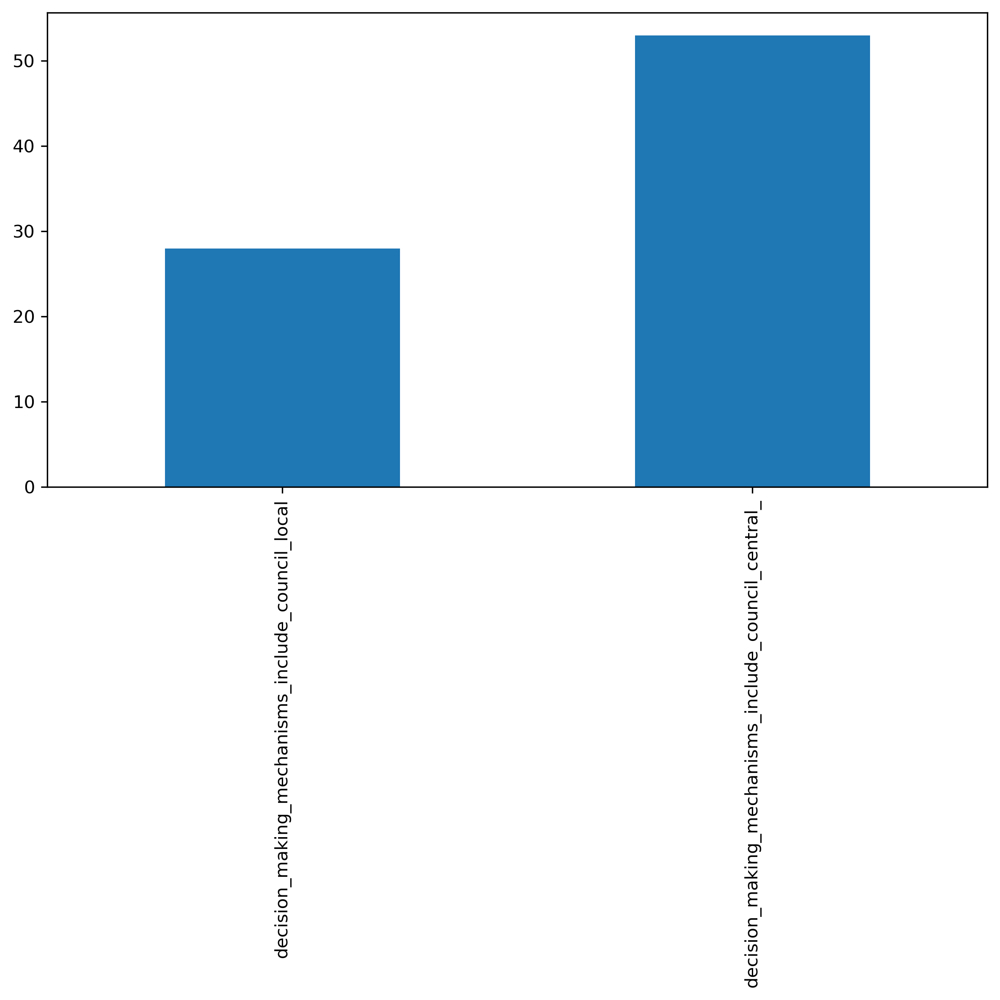

In [28]:
plt.figure(figsize=(8,8))
council_df[council_cols].sum().plot(kind='bar')

plt.tight_layout()
plt.savefig('../' + DATA_VERSION + '-fig/fig-councils/histogram.png')
plt.show()

In [29]:
council_df[['Name'] + council_cols]

,Name,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_council_central_
0,Aedui (Celtic Oppida),0,1
1,Akha,0,1
2,Amalfi,0,1
5,Athens (Classical Period),0,1
6,Aztec City-States,0,1
7,Babylonia,0,1
8,Carthage,0,1
9,Central African communities,1,0
11,Circassians,0,1
12,Cologne,0,1


## Correlations

In [30]:
data_plot = gov_df.select_dtypes(include=[np.number]).dropna()

In [31]:
data_plot.describe()

,Time span: Start,Time span: End,is_SCCS,decision_making_mechanisms_include_representation,enforcement_mechanisms_include_paying_damages_compensation,decision_making_mechanisms_include_temporary_position_of_power_term_limits,enforcement_mechanisms_include_forced_labour,decision_making_mechanisms_include_remunerated_position,access_mechanisms_include_property_requirement,access_mechanisms_include_induction_rite_ceremony,access_mechanisms_include_gerontocracy,decision_making_mechanisms_include_majority_voting,enforcement_mechanisms_include_graduated_sanctions,decision_making_mechanisms_include_plurality_voting,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_petition,access_mechanisms_include_enfranchisement,access_mechanisms_include_age_boundaries,enforcement_mechanisms_include_exit,decision_making_mechanisms_include_secret_ballot,decision_making_mechanisms_include_coalition,access_mechanisms_include_screening_process,decision_making_mechanisms_include_checks_and_balances,decision_making_mechanisms_include_consensus,decision_making_mechanisms_include_balance_of_power,enforcement_mechanisms_include_self-help,decision_making_mechanisms_include_ratification_acclamation_only,enforcement_mechanisms_include_civil_disobedience,enforcement_mechanisms_include_criticism_mocking_joking,decision_making_mechanisms_include_bureaucracy,access_mechanisms_include_meritocracy,decision_making_mechanisms_include_consent,enforcement_mechanisms_include_appeal,enforcement_mechanisms_include_litigation,decision_making_mechanisms_include_quorum,enforcement_mechanisms_include_reputational_risk,decision_making_mechanisms_include_agenda_setting,enforcement_mechanisms_include_mediation,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_confederacy,decision_making_mechanisms_include_delegation,access_mechanisms_include_matriarchy,decision_making_mechanisms_include_council_central_,decision_making_mechanisms_include_dual-sex_political_system,enforcement_mechanisms_include_judicial_review,enforcement_mechanisms_include_scrutiny_of_officials,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_consultation,decision_making_mechanisms_include_mandate,decision_making_mechanisms_include_vote_by_proxy,access_mechanisms_include_heredity,access_mechanisms_include_co-optation,enforcement_mechanisms_include_arbitration,access_mechanisms_include_payment_for_occupying_office,access_mechanisms_include_dreaming,enforcement_mechanisms_include_negotiation,decision_making_mechanisms_include_vote_by_show_of_hands,decision_making_mechanisms_include_frequent_and_or_regular_meetings,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_rule_of_law,access_mechanisms_include_matrilineality,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_unanimity,enforcement_mechanisms_include_fines,decision_making_mechanisms_include_supermajority,access_mechanisms_include_blood_relations,decision_making_mechanisms_include_council_local,access_mechanisms_include_lottery_random_selection,decision_making_mechanisms_include_veto,decision_making_mechanisms_include_lobbying,enforcement_mechanisms_include_capital_punishment,decision_making_mechanisms_include_turnover_rotation,decision_making_mechanisms_include_autocratic_leader_chief_bound,enforcement_mechanisms_include_jury_judge,decision_making_mechanisms_include_gathering,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator,enforcement_mechanisms_include_destruction_of_property,enforcement_mechanisms_include_tribunal_court_,access_mechanisms_include_open_political_unit,decision_making_mechanisms_include_kingchief-as-figurehead,access_mechanisms_include_popularity_,enforcement_mechanisms_include_seizing_of_property,access_mechanisms_include_

In [32]:
normalized = Normalizer().fit_transform(data_plot)

norm_df = pd.DataFrame(normalized)
norm_df.columns = data_plot.columns
norm_corr = norm_df.corr()

norm_corr.head()

,Time span: Start,Time span: End,is_SCCS,decision_making_mechanisms_include_representation,enforcement_mechanisms_include_paying_damages_compensation,decision_making_mechanisms_include_temporary_position_of_power_term_limits,enforcement_mechanisms_include_forced_labour,decision_making_mechanisms_include_remunerated_position,access_mechanisms_include_property_requirement,access_mechanisms_include_induction_rite_ceremony,access_mechanisms_include_gerontocracy,decision_making_mechanisms_include_majority_voting,enforcement_mechanisms_include_graduated_sanctions,decision_making_mechanisms_include_plurality_voting,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_petition,access_mechanisms_include_enfranchisement,access_mechanisms_include_age_boundaries,enforcement_mechanisms_include_exit,decision_making_mechanisms_include_secret_ballot,decision_making_mechanisms_include_coalition,access_mechanisms_include_screening_process,decision_making_mechanisms_include_checks_and_balances,decision_making_mechanisms_include_consensus,decision_making_mechanisms_include_balance_of_power,enforcement_mechanisms_include_self-help,decision_making_mechanisms_include_ratification_acclamation_only,enforcement_mechanisms_include_civil_disobedience,enforcement_mechanisms_include_criticism_mocking_joking,decision_making_mechanisms_include_bureaucracy,access_mechanisms_include_meritocracy,decision_making_mechanisms_include_consent,enforcement_mechanisms_include_appeal,enforcement_mechanisms_include_litigation,decision_making_mechanisms_include_quorum,enforcement_mechanisms_include_reputational_risk,decision_making_mechanisms_include_agenda_setting,enforcement_mechanisms_include_mediation,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_confederacy,decision_making_mechanisms_include_delegation,access_mechanisms_include_matriarchy,decision_making_mechanisms_include_council_central_,decision_making_mechanisms_include_dual-sex_political_system,enforcement_mechanisms_include_judicial_review,enforcement_mechanisms_include_scrutiny_of_officials,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_consultation,decision_making_mechanisms_include_mandate,decision_making_mechanisms_include_vote_by_proxy,access_mechanisms_include_heredity,access_mechanisms_include_co-optation,enforcement_mechanisms_include_arbitration,access_mechanisms_include_payment_for_occupying_office,access_mechanisms_include_dreaming,enforcement_mechanisms_include_negotiation,decision_making_mechanisms_include_vote_by_show_of_hands,decision_making_mechanisms_include_frequent_and_or_regular_meetings,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_rule_of_law,access_mechanisms_include_matrilineality,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_unanimity,enforcement_mechanisms_include_fines,decision_making_mechanisms_include_supermajority,access_mechanisms_include_blood_relations,decision_making_mechanisms_include_council_local,access_mechanisms_include_lottery_random_selection,decision_making_mechanisms_include_veto,decision_making_mechanisms_include_lobbying,enforcement_mechanisms_include_capital_punishment,decision_making_mechanisms_include_turnover_rotation,decision_making_mechanisms_include_autocratic_leader_chief_bound,enforcement_mechanisms_include_jury_judge,decision_making_mechanisms_include_gathering,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator,enforcement_mechanisms_include_destruction_of_property,enforcement_mechanisms_include_tribunal_court_,access_mechanisms_include_open_political_unit,decision_making_mechanisms_include_kingchief-as-figurehead,access_mechanisms_include_popularity_,enforcement_mechanisms_include_seizing_of_property,access_mechanisms_include_

In [33]:
councils_corr = norm_corr[council_cols]

In [34]:
councils_corr

,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_council_central_
Time span: Start,0.262713,-0.461657
Time span: End,0.231781,-0.347591
is_SCCS,0.050955,0.058574
decision_making_mechanisms_include_representation,0.575679,-0.146696
enforcement_mechanisms_include_paying_damages_compensation,-0.065690,0.222535
decision_making_mechanisms_include_temporary_position_of_power_term_limits,-0.239227,0.495713
enforcement_mechanisms_include_forced_labour,-0.048328,0.192107
decision_making_mechanisms_include_remunerated_position,-0.191642,0.289863
access_mechanisms_include_property_requirement,-0.137115,0.185461
access_mechanisms_include_induction_rite_ceremony,0.030764,-0.048392


TODO:
- Councils:
    - Sort and visualize correlations, local
    - Sort and visualize correlations, central
    - Histograms: region, size, time
    - Graph timeline
    - Graph region
- Courts
    - Sort and visualize correlations
    - Histograms: region, size, time
    - Graph timeline
    - Graph region

## Councils Analysis: Local and Central x Mechanisms

In [35]:
plt.figure(figsize=(25,25))
sns.heatmap(
    councils_corr.sort_values(by='decision_making_mechanisms_include_council_local', ascending=False), 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig('../' + DATA_VERSION + '-fig/fig-councils/councils_local_corr.png')
plt.show()

In [36]:
plt.figure(figsize=(25,25))
sns.heatmap(
    councils_corr.sort_values(by='decision_making_mechanisms_include_council_central_', ascending=False), 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig('../' + DATA_VERSION + '-fig/fig-councils/councils_central_corr.png')
plt.show()

### Access

In [37]:
access_councils_corr = councils_corr[councils_corr.index.str.startswith('access')]

In [38]:
access_councils_corr

,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_council_central_
access_mechanisms_include_property_requirement,-0.137115,0.185461
access_mechanisms_include_induction_rite_ceremony,0.030764,-0.048392
access_mechanisms_include_gerontocracy,0.089661,0.006472
access_mechanisms_include_enfranchisement,-0.098576,0.292390
access_mechanisms_include_age_boundaries,-0.128754,0.275390
access_mechanisms_include_screening_process,-0.098572,0.338199
access_mechanisms_include_meritocracy,0.210074,-0.185697
access_mechanisms_include_matriarchy,0.193441,0.013156
access_mechanisms_include_heredity,0.156351,-0.022212
access_mechanisms_include_co-optation,-0.001565,-0.004515


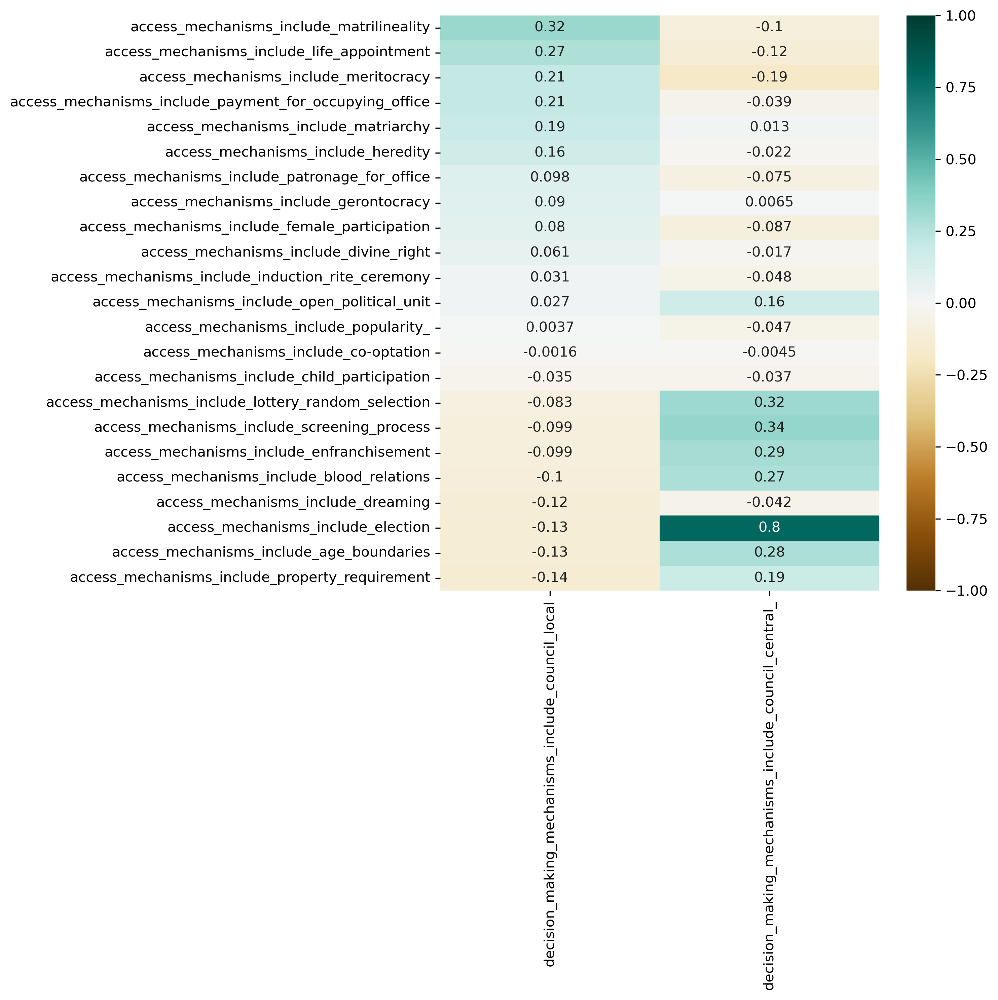

In [39]:
plt.figure(figsize=(10,10))
sns.heatmap(
    access_councils_corr.sort_values(by='decision_making_mechanisms_include_council_local', ascending=False), 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig('../' + DATA_VERSION + '-fig/fig-councils/access_councils_local_corr.png')
plt.show()

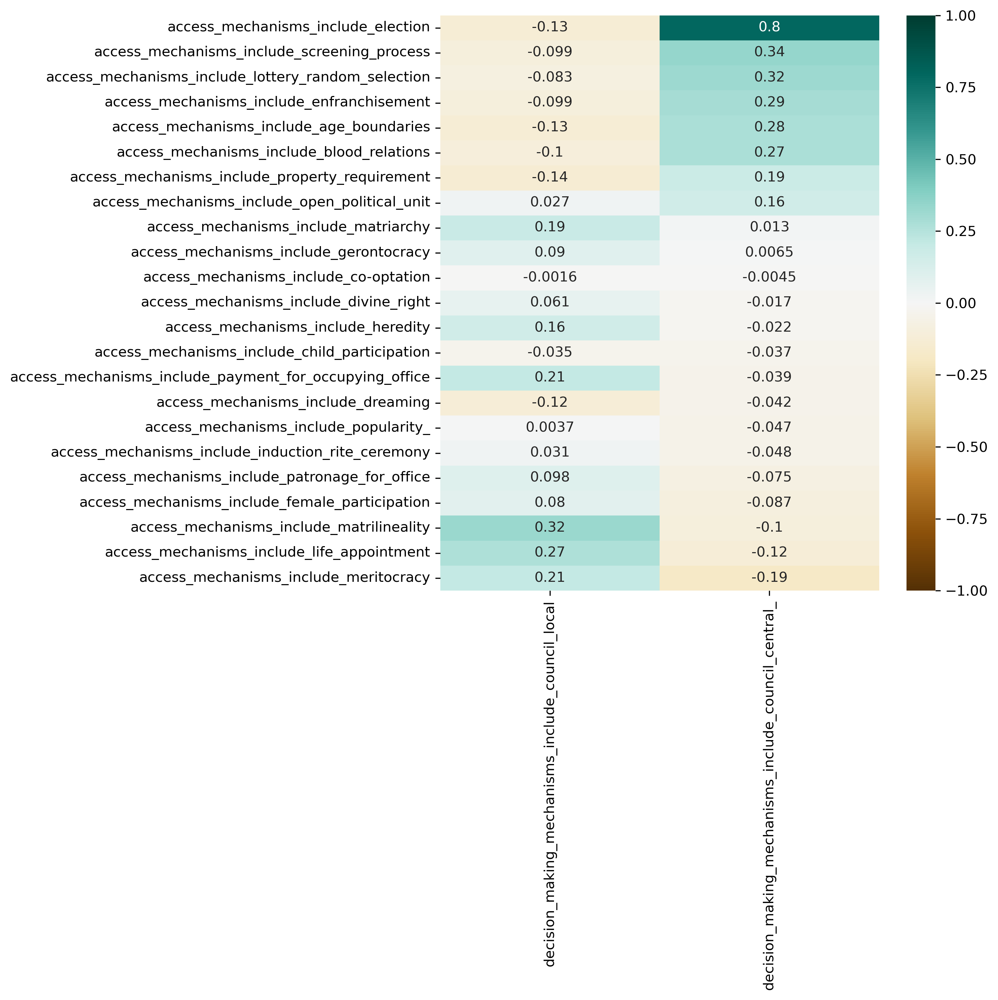

In [40]:
plt.figure(figsize=(10,10))
sns.heatmap(
    access_councils_corr.sort_values(by='decision_making_mechanisms_include_council_central_', ascending=False), 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig('../' + DATA_VERSION + '-fig/fig-councils/access_councils_central_corr.png')
plt.show()

### Decision Making

In [41]:
dm_councils_corr = councils_corr[councils_corr.index.str.startswith('decision_making')]

In [42]:
dm_councils_corr

,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_council_central_
decision_making_mechanisms_include_representation,0.575679,-0.146696
decision_making_mechanisms_include_temporary_position_of_power_term_limits,-0.239227,0.495713
decision_making_mechanisms_include_remunerated_position,-0.191642,0.289863
decision_making_mechanisms_include_majority_voting,-0.091980,0.224450
decision_making_mechanisms_include_plurality_voting,-0.016643,0.240964
decision_making_mechanisms_include_assembly_local,0.009254,-0.216598
decision_making_mechanisms_include_petition,0.095412,-0.075547
decision_making_mechanisms_include_secret_ballot,-0.108875,0.322082
decision_making_mechanisms_include_coalition,-0.069333,0.038787
decision_making_mechanisms_include_checks_and_balances,-0.004211,0.166154


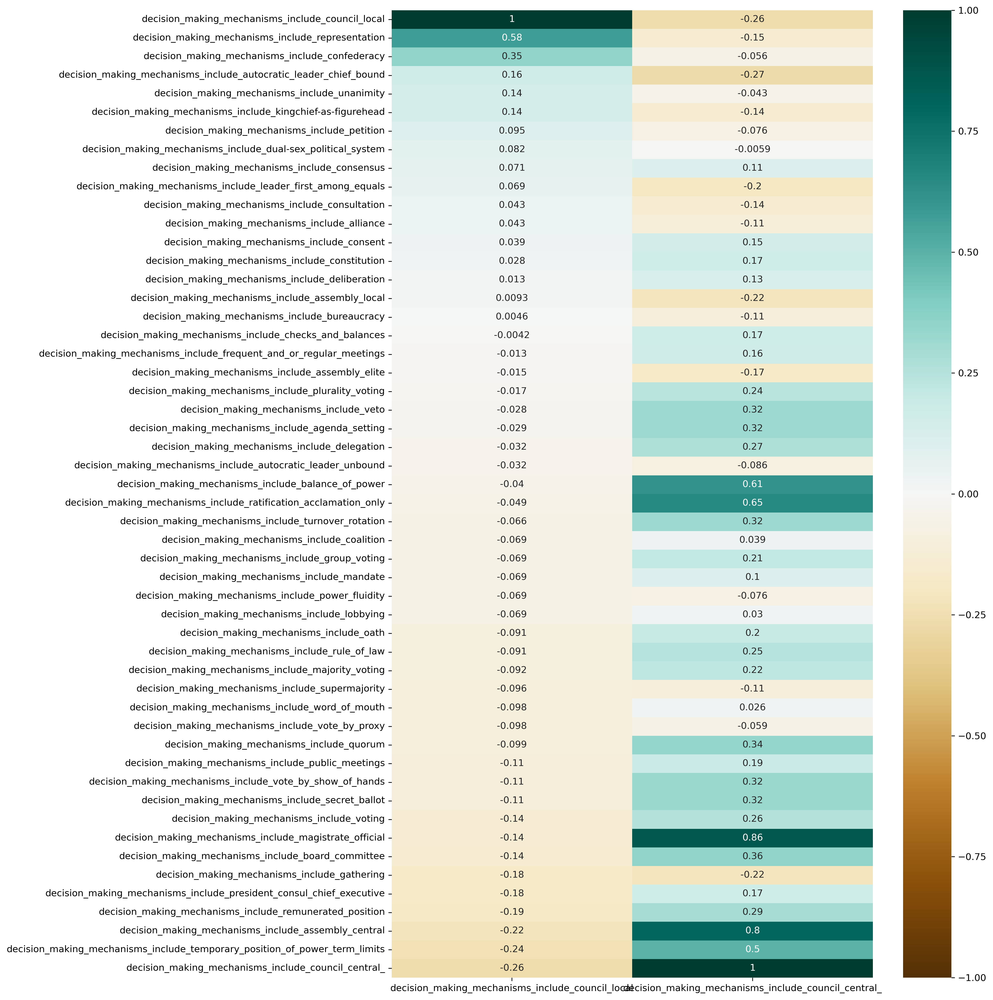

In [43]:
plt.figure(figsize=(15,15))
sns.heatmap(
    dm_councils_corr.sort_values(by='decision_making_mechanisms_include_council_local', ascending=False), 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig('../' + DATA_VERSION + '-fig/fig-councils/dm_councils_local_corr.png')
plt.show()

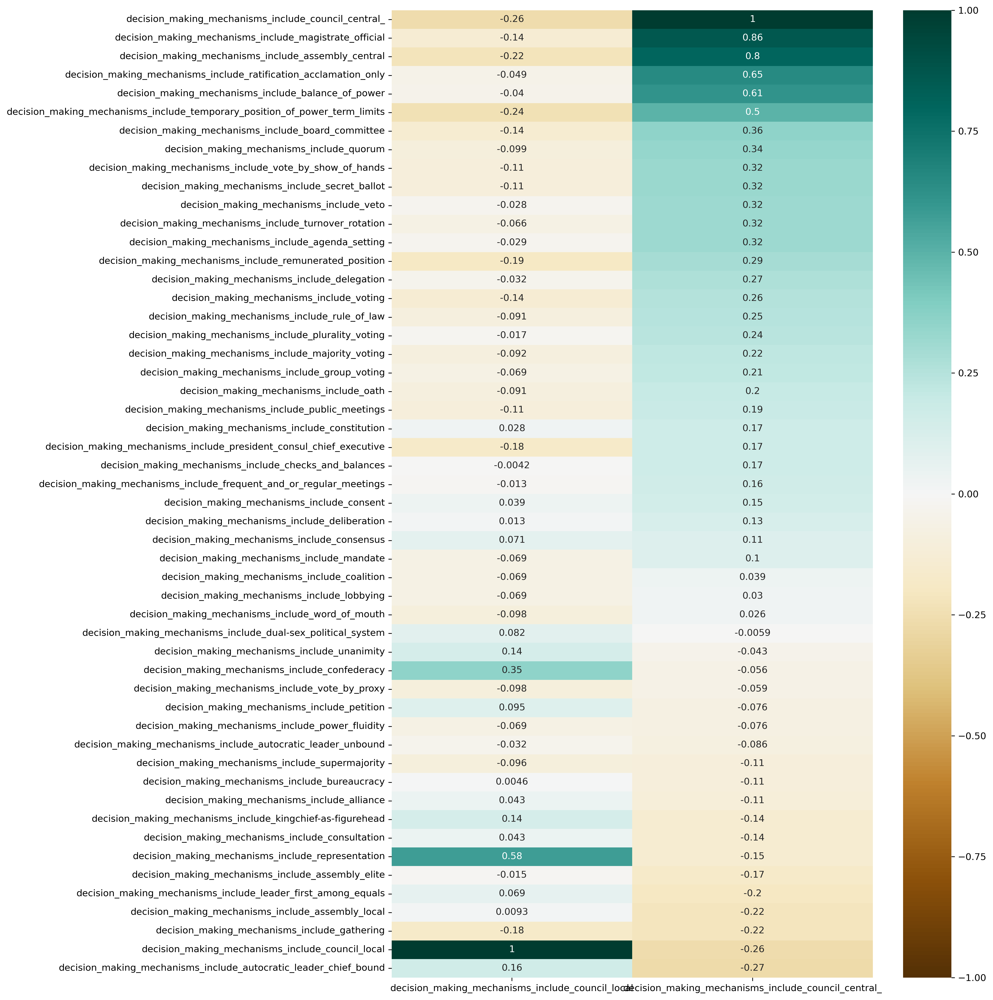

In [44]:
plt.figure(figsize=(15,15))
sns.heatmap(
    dm_councils_corr.sort_values(by='decision_making_mechanisms_include_council_central_', ascending=False), 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig('../' + DATA_VERSION + '-fig/fig-councils/dm_councils_central_corr.png')
plt.show()

### Enforcement

In [45]:
enforcement_councils_corr = councils_corr[councils_corr.index.str.startswith('enforcement')]

In [46]:
enforcement_councils_corr

,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_council_central_
enforcement_mechanisms_include_paying_damages_compensation,-0.065690,0.222535
enforcement_mechanisms_include_forced_labour,-0.048328,0.192107
enforcement_mechanisms_include_graduated_sanctions,-0.098594,0.003559
enforcement_mechanisms_include_monitoring,-0.088900,0.244873
enforcement_mechanisms_include_exit,-0.030884,-0.112386
enforcement_mechanisms_include_self-help,-0.102431,0.156811
enforcement_mechanisms_include_civil_disobedience,-0.069333,0.005955
enforcement_mechanisms_include_criticism_mocking_joking,-0.004590,0.174231
enforcement_mechanisms_include_appeal,-0.053700,-0.085309
enforcement_mechanisms_include_litigation,-0.086756,0.179926


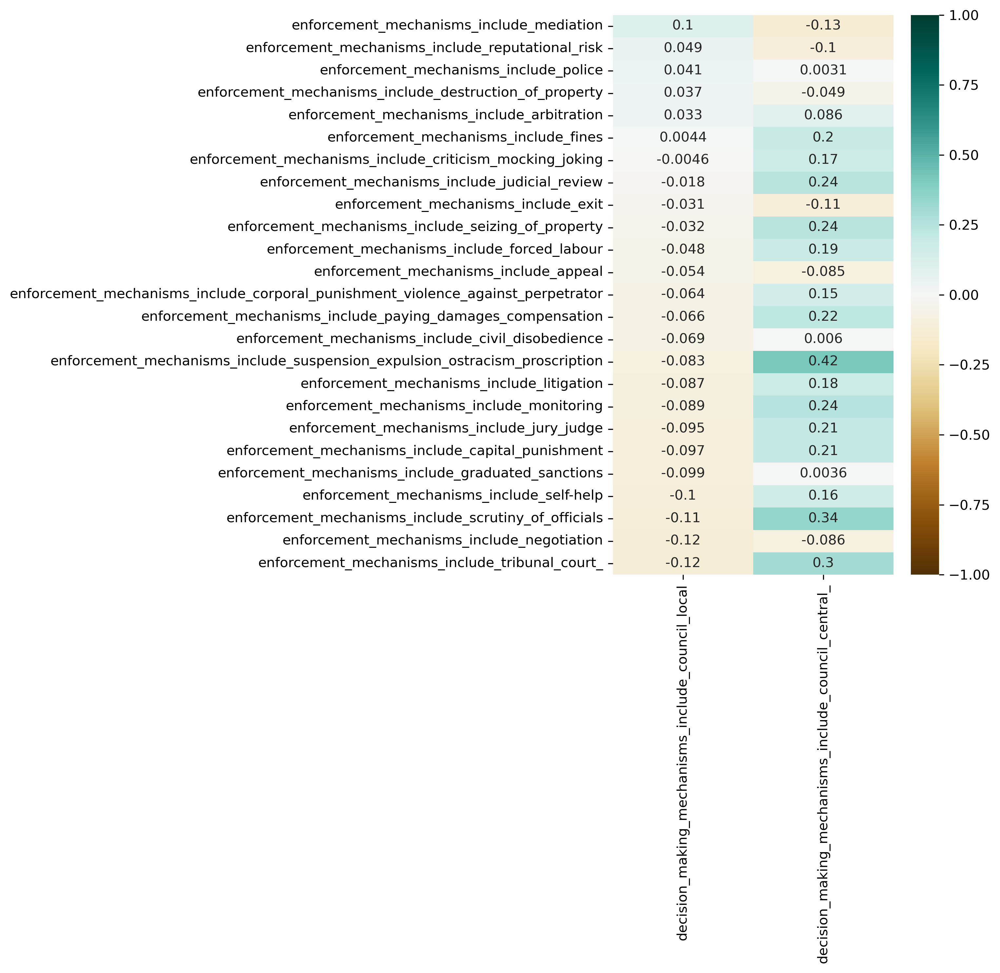

In [47]:
plt.figure(figsize=(10,10))
sns.heatmap(
    enforcement_councils_corr.sort_values(by='decision_making_mechanisms_include_council_local', ascending=False), 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig('../' + DATA_VERSION + '-fig/fig-councils/enforcement_councils_local_corr.png')
plt.show()

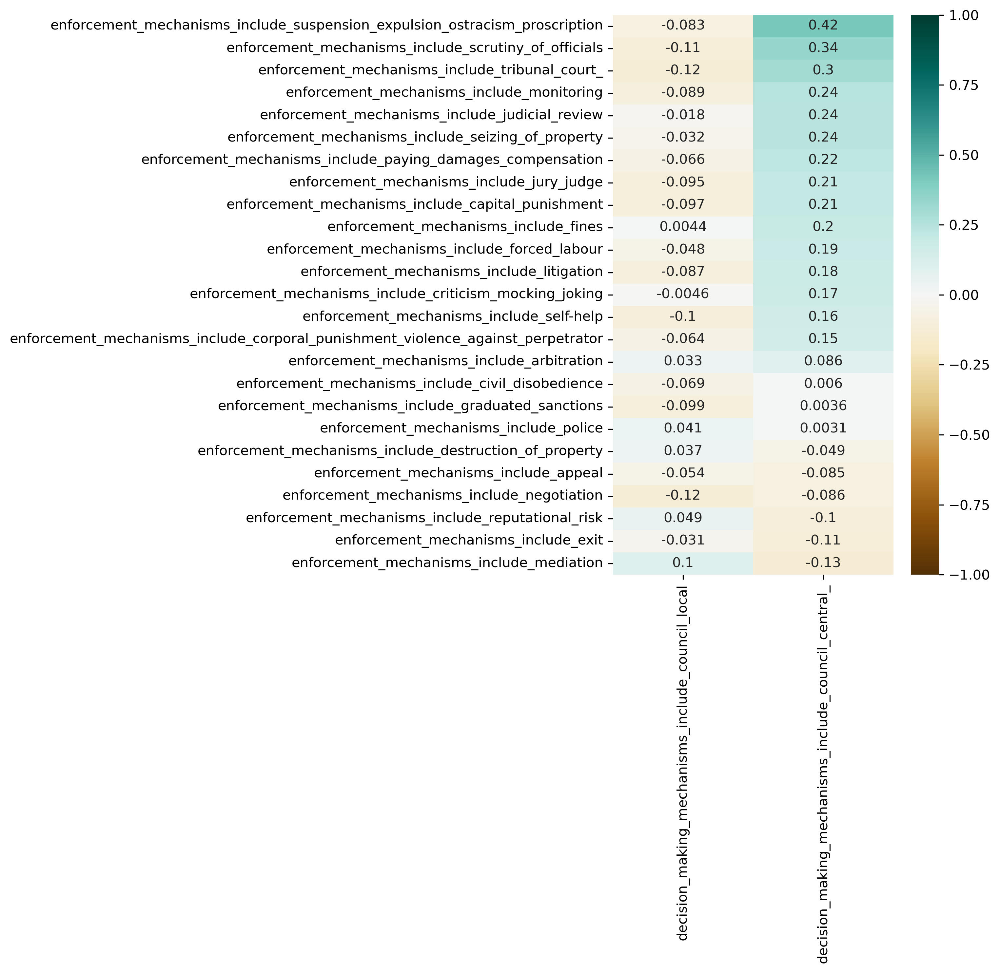

In [48]:
plt.figure(figsize=(10,10))
sns.heatmap(
    enforcement_councils_corr.sort_values(by='decision_making_mechanisms_include_council_central_', ascending=False), 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig('../' + DATA_VERSION + '-fig/fig-councils/enforcement_councils_central_corr.png')
plt.show()

## Councils Analysis: Size

In [49]:
size_cols = [col for col in col_list if col.startswith('Size:')]
size_cols

['Size: 100 - 1,000',
 'Size: 1,001 - 10,000',
 'Size: 10,001 - 100,000',
 'Size: 100,001 - 1,000,000',
 'Size: 1,000,001 - 10,000,000',
 'Size: 10,000,000+',
 'Size: Unknown']

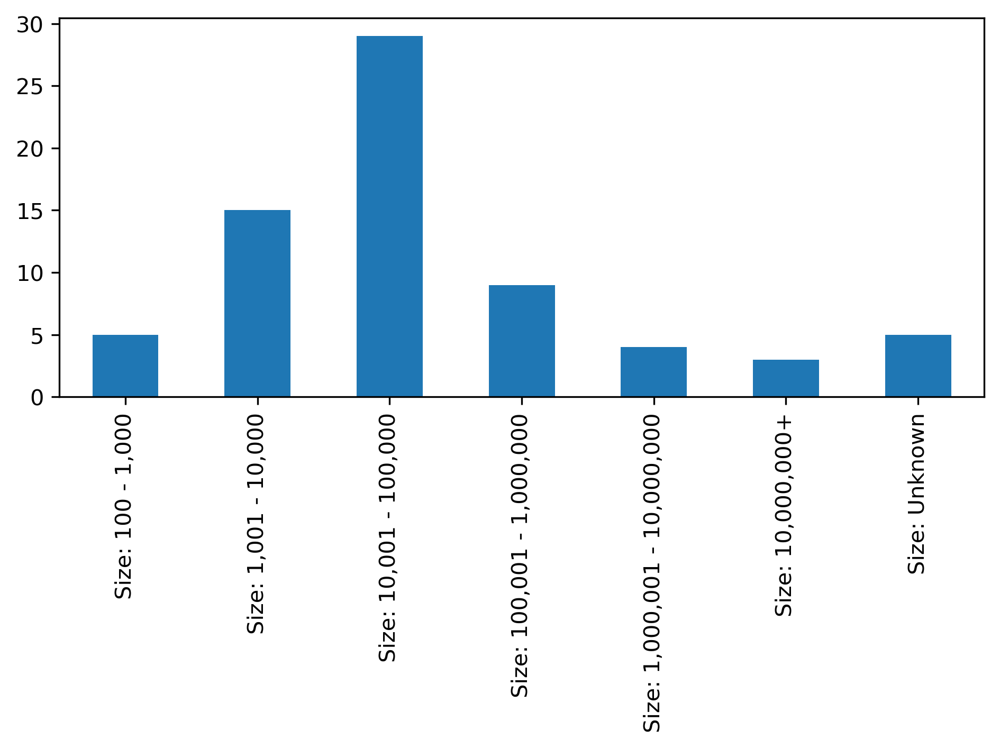

In [50]:
# Size histogram
council_df[size_cols].sum().plot(kind='bar')

plt.tight_layout()
plt.savefig('../' + DATA_VERSION + '-fig/fig-councils/all_councils_size_histogram.png')
plt.show()

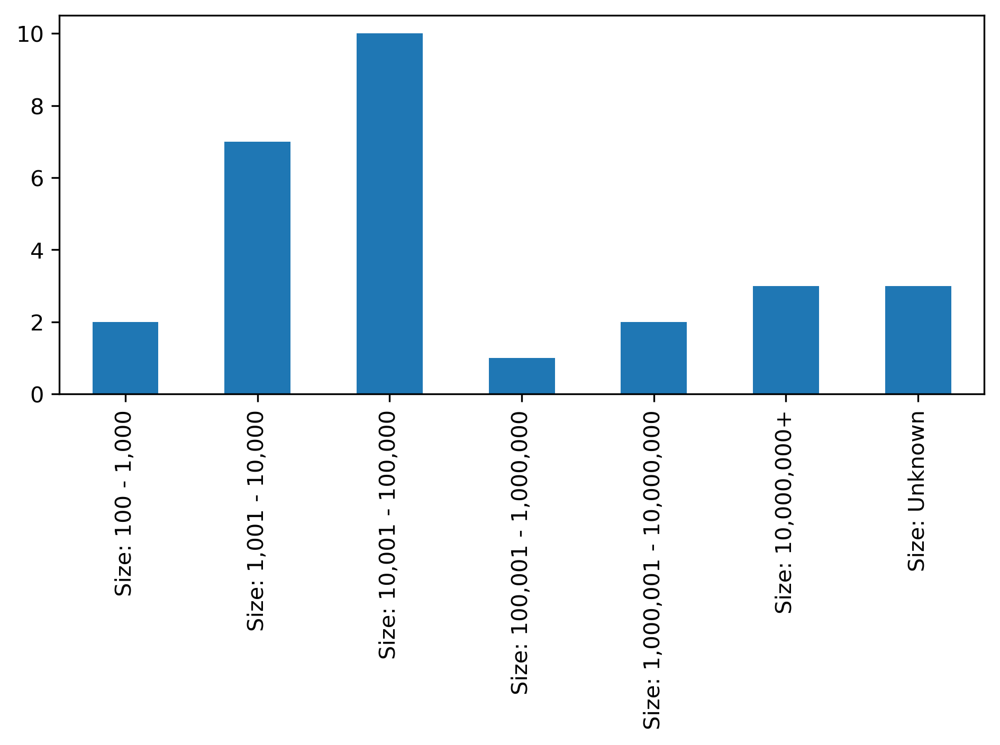

In [51]:
# Size histogram
local_councils_df[size_cols].sum().plot(kind='bar')

plt.tight_layout()
plt.savefig('../' + DATA_VERSION + '-fig/fig-councils/local_councils_size_histogram.png')

plt.show()

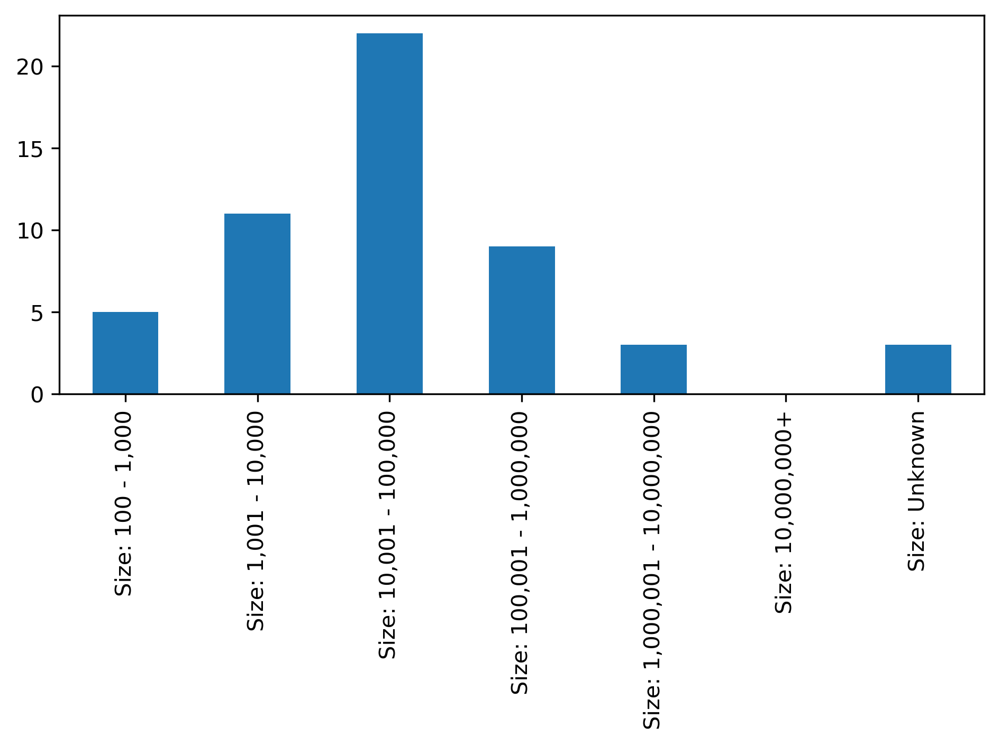

In [52]:
# Size histogram
central_councils_df[size_cols].sum().plot(kind='bar')

plt.tight_layout()
plt.savefig('../' + DATA_VERSION + '-fig/fig-councils/central_councils_size_histogram.png')
plt.show()

In [53]:
size_councils_corr = councils_corr[councils_corr.index.str.startswith('Size:')]

In [54]:
size_councils_corr

,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_council_central_
"Size: 100 - 1,000",0.031994,0.005297
"Size: 1,001 - 10,000",-0.029979,-0.013900
"Size: 10,001 - 100,000",-0.117718,0.169232
"Size: 100,001 - 1,000,000",-0.139295,0.751568
"Size: 1,000,001 - 10,000,000",-0.074538,0.118204
"Size: 10,000,000+",0.158019,-0.140415
Size: Unknown,0.000597,-0.075603


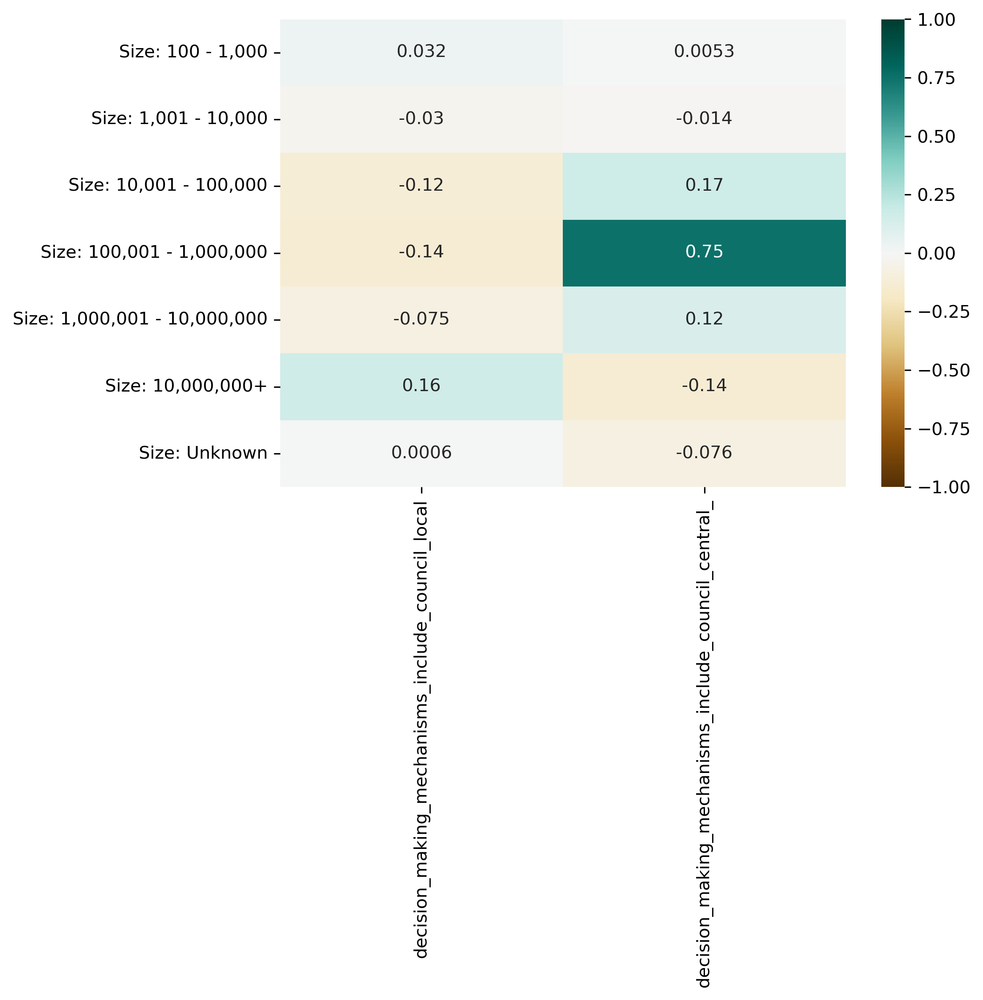

In [55]:
plt.figure(figsize=(8,8))
sns.heatmap(
    size_councils_corr, 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig('../' + DATA_VERSION + '-fig/fig-councils/councils_size_corr.png')
plt.show()

## Councils Analysis: Region

In [56]:
region_cols = [col for col in col_list if col.startswith('Region:')]
region_cols

['Region: Africa',
 'Region: Europe',
 'Region: Asia',
 'Region: Middle East',
 'Region: North America',
 'Region: Central America',
 'Region: South America',
 'Region: Oceania']

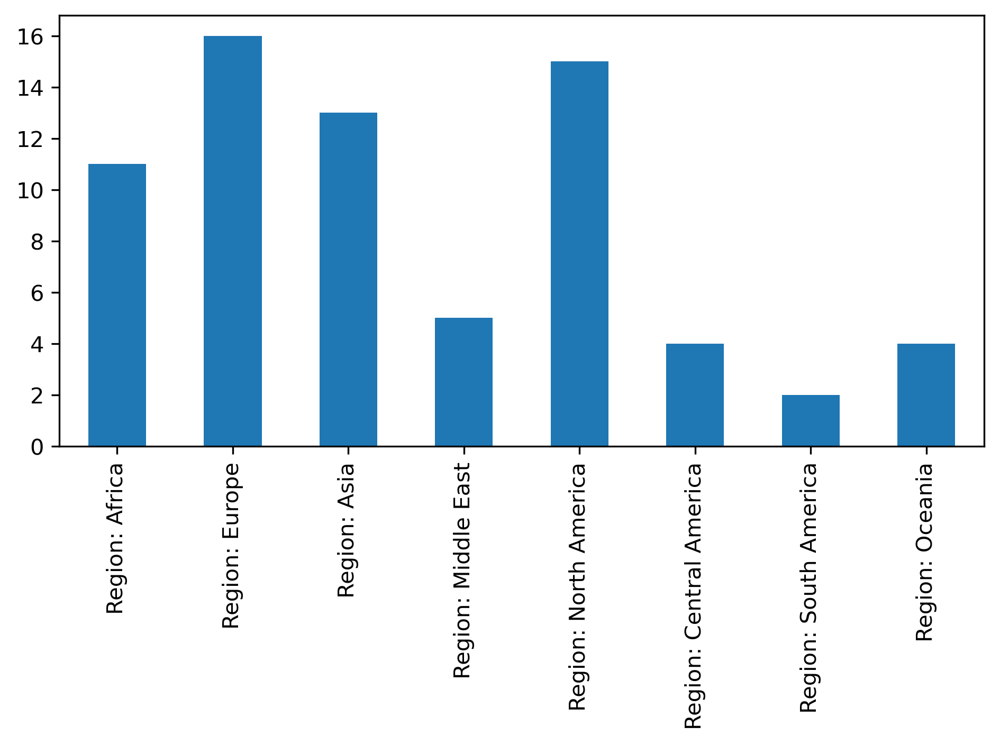

In [57]:
# Region histogram
council_df[region_cols].sum().plot(kind='bar')

plt.tight_layout()
plt.savefig('../' + DATA_VERSION + '-fig/fig-councils/all_councils_region_histogram.png')
plt.show()

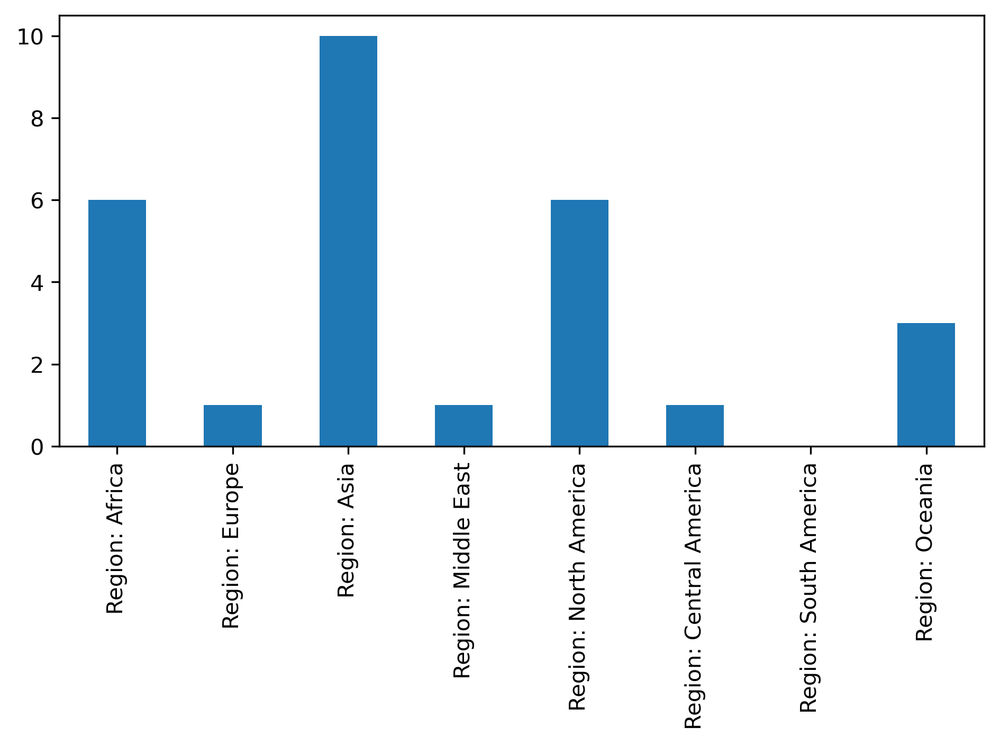

In [58]:
# Region histogram
local_councils_df[region_cols].sum().plot(kind='bar')

plt.tight_layout()
plt.savefig('../' + DATA_VERSION + '-fig/fig-councils/local_councils_region_histogram.png')
plt.show()

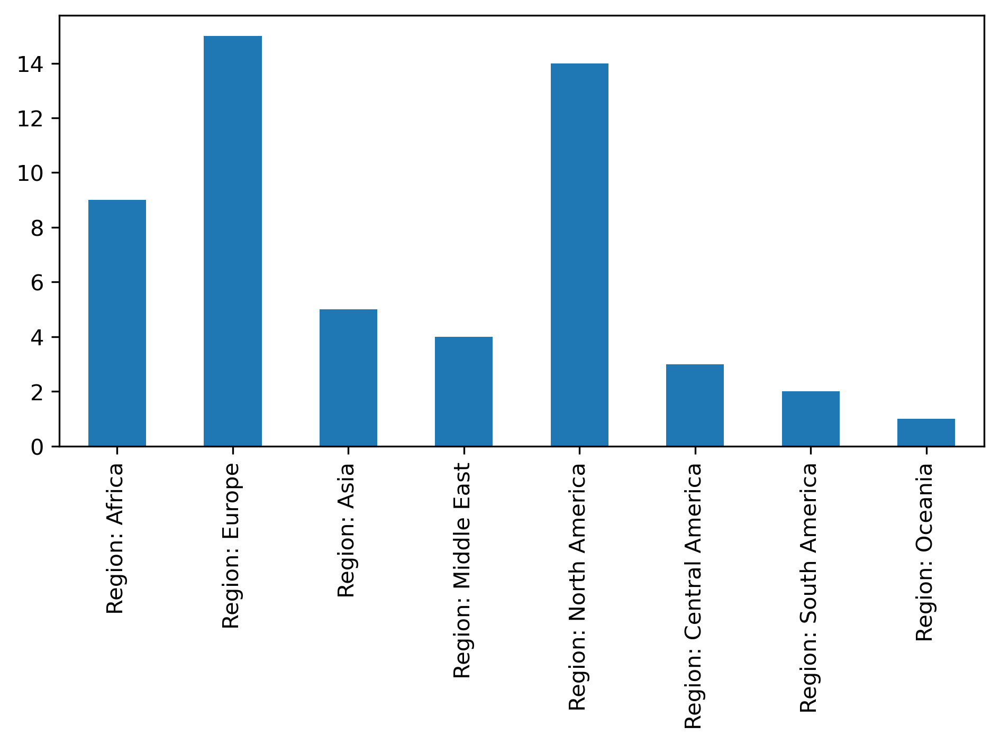

In [59]:
# Region histogram
central_councils_df[region_cols].sum().plot(kind='bar')

plt.tight_layout()
plt.savefig('../' + DATA_VERSION + '-fig/fig-councils/central_councils_region_histogram.png')
plt.show()

In [60]:
region_councils_corr = councils_corr[councils_corr.index.str.startswith('Region:')]

In [61]:
region_councils_corr

,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_council_central_
Region: Africa,0.040250,0.220460
Region: Europe,-0.258405,0.774511
Region: Asia,0.188168,-0.226402
Region: Middle East,-0.101211,-0.002171
Region: North America,0.082845,-0.019348
Region: Central America,-0.076935,-0.013779
Region: South America,-0.140471,-0.060382
Region: Oceania,0.145984,-0.138498


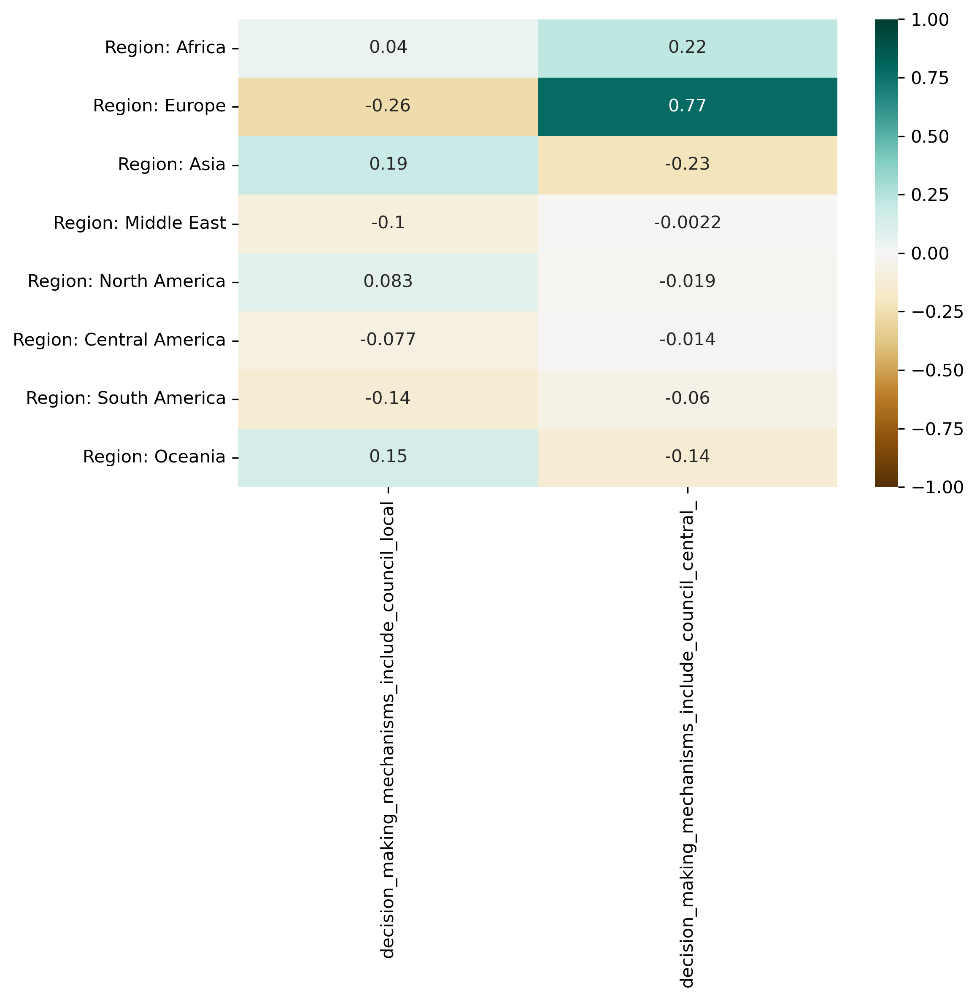

In [62]:
plt.figure(figsize=(8,8))
sns.heatmap(
    region_councils_corr, 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig('../' + DATA_VERSION + '-fig/fig-councils/councils_region_corr.png')
plt.show()

### Mapping council regions

In [63]:
worldmap = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))

worldmap.head()

/var/folders/v7/8x_7ty4j3m76hgg7tncks_kc0000gn/T/ipykernel_2765/1532259957.py:1: FutureWarning:

The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.



,pop_est,continent,name,iso_a3,gdp_md_est,geometry
0,889953.0,Oceania,Fiji,FJI,5496,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,58005463.0,Africa,Tanzania,TZA,63177,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,603253.0,Africa,W. Sahara,ESH,907,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,37589262.0,North America,Canada,CAN,1736425,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742..."
4,328239523.0,North America,United States of America,USA,21433226,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."


In [64]:
central_america_countries = [
    'Belize',
    'Costa Rica',
    'El Salvador',
    'Guatemala',
    'Honduras',
    'Nicaragua',
    'Panama'
]

middle_east_countries = [
    'Cyprus',
    'Egypt',
    'Iran',
    'Iraq',
    'Israel',
    'Jordan',
    'Kuwait',
    'Lebanon',
    'Oman',
    'Palestine',
    'Qatar',
    'Saudi Arabia',
    'Syria',
    'Turkey',
    'United Arab Emirates',
    'Yemen'
]

# Add region for Central America
worldmap.loc[(worldmap['name'].isin(central_america_countries)), 'continent'] = 'Central America'

# Add region for Middle East
worldmap.loc[(worldmap['name'].isin(middle_east_countries)), 'continent'] = 'Middle East'

worldmap['continent'].value_counts()

continent
Africa                     50
Europe                     39
Asia                       32
Middle East                16
South America              13
North America              11
Oceania                     7
Central America             7
Seven seas (open ocean)     1
Antarctica                  1
Name: count, dtype: int64

In [65]:
region_map = gpd.GeoDataFrame(columns=['Region', 'geometry'])
regions_list = list(gov_df['Region'].unique())

In [66]:
region_map['Region'] = regions_list

region_map['geometry'].loc[region_map['Region'] == 'Africa'] = worldmap.loc[(worldmap['continent'] == 'Africa')].unary_union
region_map['geometry'].loc[region_map['Region'] == 'Europe'] = worldmap.loc[(worldmap['continent'] == 'Europe')].unary_union
region_map['geometry'].loc[region_map['Region'] == 'Asia'] = worldmap.loc[(worldmap['continent'] == 'Asia')].unary_union
region_map['geometry'].loc[region_map['Region'] == 'Middle East'] = worldmap.loc[(worldmap['continent'] == 'Middle East')].unary_union
region_map['geometry'].loc[region_map['Region'] == 'North America'] = worldmap.loc[(worldmap['continent'] == 'North America')].unary_union
region_map['geometry'].loc[region_map['Region'] == 'Central America'] = worldmap.loc[(worldmap['continent'] == 'Central America')].unary_union
region_map['geometry'].loc[region_map['Region'] == 'South America'] = worldmap.loc[(worldmap['continent'] == 'South America')].unary_union
region_map['geometry'].loc[region_map['Region'] == 'Oceania'] = worldmap.loc[(worldmap['continent'] == 'Oceania')].unary_union

region_map

/var/folders/v7/8x_7ty4j3m76hgg7tncks_kc0000gn/T/ipykernel_2765/454843215.py:3: FutureWarning:

ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


/var/folders/v7/8x_7ty4j3m76hgg7tncks_kc0000gn/T/ipykernel_2765/454843215.py:4: FutureWarning:

ChainedAssignmentEr

,Region,geometry
0,Europe,"MULTIPOLYGON (((-53.555 2.335, -53.779 2.377, ..."
1,Asia,"MULTIPOLYGON (((105.857 -4.306, 105.818 -5.852..."
2,Middle East,"MULTIPOLYGON (((25.000 25.682, 25.000 29.239, ..."
3,Central America,"POLYGON ((-77.243 7.935, -77.431 7.638, -77.75..."
4,Africa,"MULTIPOLYGON (((-11.439 6.786, -11.708 6.860, ..."
5,North America,"MULTIPOLYGON (((-155.222 19.240, -155.542 19.0..."
6,South America,"MULTIPOLYGON (((-68.640 -55.580, -69.232 -55.4..."
7,Oceania,"MULTIPOLYGON (((147.914 -43.212, 147.565 -42.9..."


#### All Councils

In [67]:
all_councils_region_map = region_map

In [68]:
councils_region_counts = council_df['Region'].value_counts().rename_axis('Region').reset_index(name='Count')

In [69]:
councils_region_counts

,Region,Count
0,Europe,16
1,North America,15
2,Asia,13
3,Africa,11
4,Middle East,5
5,Central America,4
6,Oceania,4
7,South America,2


In [70]:
all_merged_regions = pd.merge(all_councils_region_map, councils_region_counts, on='Region')

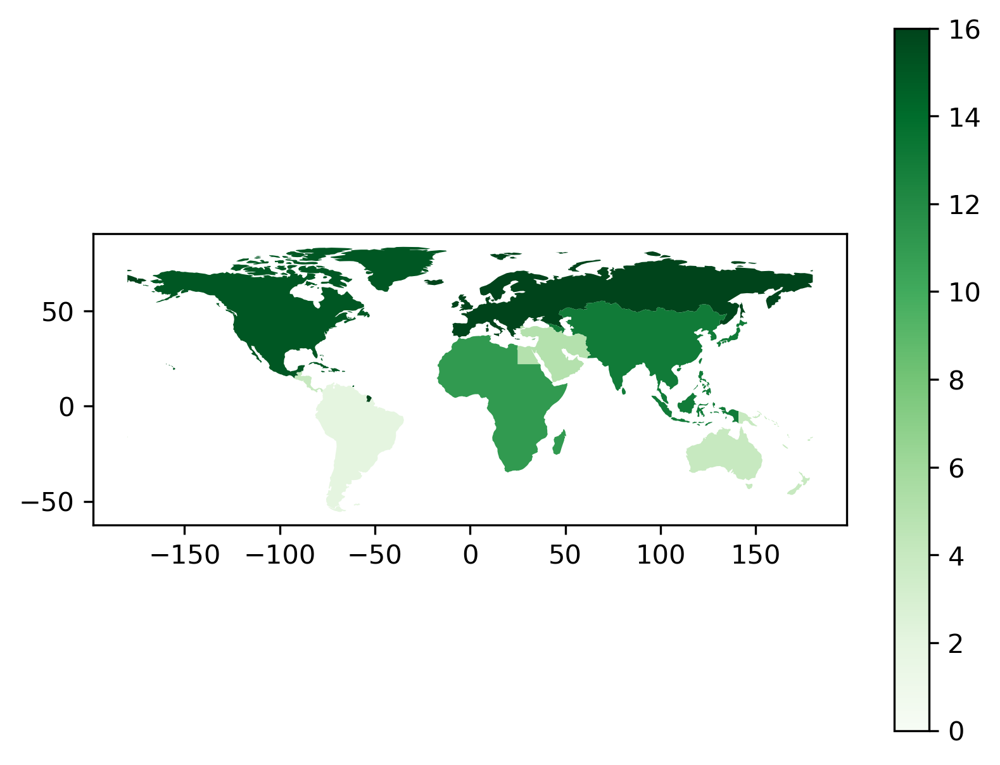

In [71]:
all_merged_regions.plot(
    column='Count', 
    legend=True,
    cmap='Greens',
    vmin=0,
    vmax=16
)

plt.savefig('../' + DATA_VERSION + '-fig/fig-councils/map_councils_all.png')
plt.show()

#### Local Councils

In [72]:
local_councils_region_map = region_map

In [73]:
local_councils_region_counts = local_councils_df['Region'].value_counts().rename_axis('Region').reset_index(name='Count')

In [74]:
local_councils_region_counts

,Region,Count
0,Asia,10
1,North America,6
2,Africa,6
3,Oceania,3
4,Europe,1
5,Middle East,1
6,Central America,1


In [75]:
local_merged_regions = pd.merge(local_councils_region_map, local_councils_region_counts, on='Region')

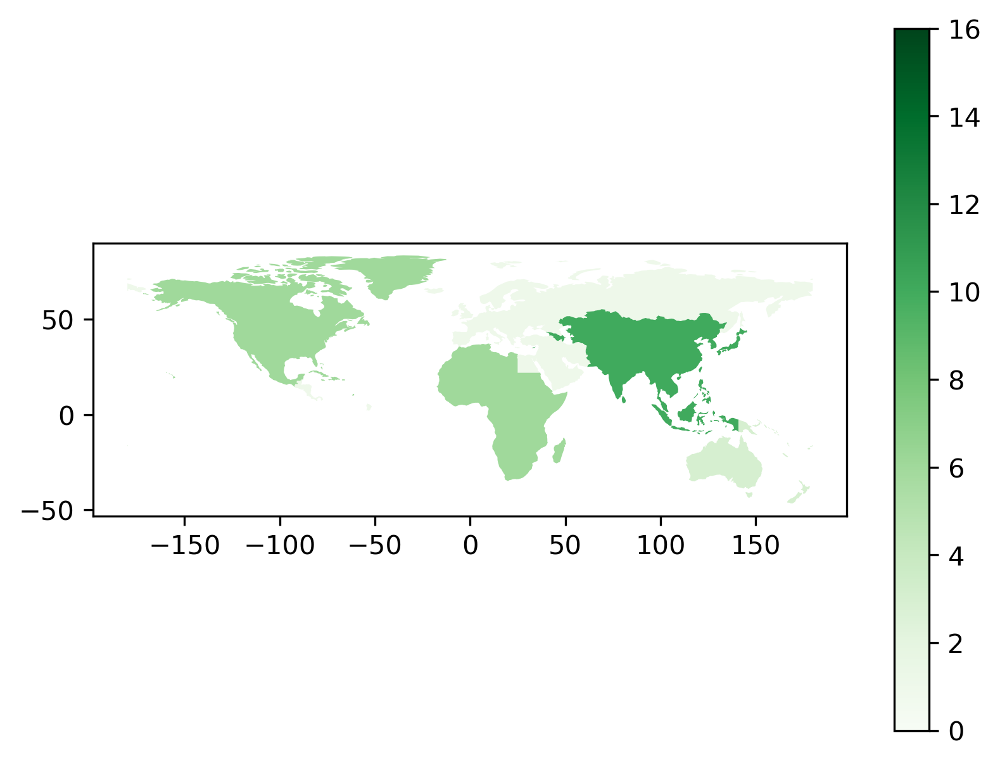

In [76]:
local_merged_regions.plot(
    column='Count', 
    legend=True,
    cmap='Greens',
    vmin=0,
    vmax=16
)

plt.savefig('../' + DATA_VERSION + '-fig/fig-councils/map_councils_local.png')
plt.show()

#### Central Councils

In [77]:
central_councils_region_map = region_map

In [78]:
central_councils_region_counts = central_councils_df['Region'].value_counts().rename_axis('Region').reset_index(name='Count')

In [79]:
central_councils_df.loc[central_councils_df['Name'] == 'Pawnee']

,Name,Institutions,Mechanism,Notes,Time span,Geography,Size,Source,Metanotes,Heterogeneity,FC comments,expert check,Time span: Start,Time span: End,SCCS,is_SCCS,decision_making_mechanisms_include_representation,enforcement_mechanisms_include_paying_damages_compensation,decision_making_mechanisms_include_temporary_position_of_power_term_limits,enforcement_mechanisms_include_forced_labour,decision_making_mechanisms_include_remunerated_position,access_mechanisms_include_property_requirement,access_mechanisms_include_induction_rite_ceremony,access_mechanisms_include_gerontocracy,decision_making_mechanisms_include_majority_voting,enforcement_mechanisms_include_graduated_sanctions,decision_making_mechanisms_include_plurality_voting,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_petition,access_mechanisms_include_enfranchisement,access_mechanisms_include_age_boundaries,enforcement_mechanisms_include_exit,decision_making_mechanisms_include_secret_ballot,decision_making_mechanisms_include_coalition,access_mechanisms_include_screening_process,decision_making_mechanisms_include_checks_and_balances,decision_making_mechanisms_include_consensus,decision_making_mechanisms_include_balance_of_power,enforcement_mechanisms_include_self-help,decision_making_mechanisms_include_ratification_acclamation_only,enforcement_mechanisms_include_civil_disobedience,enforcement_mechanisms_include_criticism_mocking_joking,decision_making_mechanisms_include_bureaucracy,access_mechanisms_include_meritocracy,decision_making_mechanisms_include_consent,enforcement_mechanisms_include_appeal,enforcement_mechanisms_include_litigation,decision_making_mechanisms_include_quorum,enforcement_mechanisms_include_reputational_risk,decision_making_mechanisms_include_agenda_setting,enforcement_mechanisms_include_mediation,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_confederacy,decision_making_mechanisms_include_delegation,access_mechanisms_include_matriarchy,decision_making_mechanisms_include_council_central_,decision_making_mechanisms_include_dual-sex_political_system,enforcement_mechanisms_include_judicial_review,enforcement_mechanisms_include_scrutiny_of_officials,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_consultation,decision_making_mechanisms_include_mandate,decision_making_mechanisms_include_vote_by_proxy,access_mechanisms_include_heredity,access_mechanisms_include_co-optation,enforcement_mechanisms_include_arbitration,access_mechanisms_include_payment_for_occupying_office,access_mechanisms_include_dreaming,enforcement_mechanisms_include_negotiation,decision_making_mechanisms_include_vote_by_show_of_hands,decision_making_mechanisms_include_frequent_and_or_regular_meetings,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_rule_of_law,access_mechanisms_include_matrilineality,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_unanimity,enforcement_mechanisms_include_fines,decision_making_mechanisms_include_supermajority,access_mechanisms_include_blood_relations,decision_making_mechanisms_include_council_local,access_mechanisms_include_lottery_random_selection,decision_making_mechanisms_include_veto,decision_making_mechanisms_include_lobbying,enforcement_mechanisms_include_capital_punishment,decision_making_mechanisms_include_turnover_rotation,decision_making_mechanisms_include_autocratic_leader_chief_bound,enforcement_mechanisms_include_jury_judge,decision_making_mechanisms_include_gathering,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator,enforcement_mechanisms_include_destruction_of_property,enforcement_mechanisms_include_tribunal_court_,access_mechanisms_include_open_political_unit,decision_making_mechanisms_include_kingchief-as-figure

In [80]:
central_councils_region_counts

,Region,Count
0,Europe,15
1,North America,14
2,Africa,9
3,Asia,5
4,Middle East,4
5,Central America,3
6,South America,2
7,Oceania,1


In [81]:
central_merged_regions = pd.merge(central_councils_region_map, central_councils_region_counts, on='Region')

In [82]:
central_merged_regions

,Region,geometry,Count
0,Europe,"MULTIPOLYGON (((-53.555 2.335, -53.779 2.377, ...",15
1,Asia,"MULTIPOLYGON (((105.857 -4.306, 105.818 -5.852...",5
2,Middle East,"MULTIPOLYGON (((25.000 25.682, 25.000 29.239, ...",4
3,Central America,"POLYGON ((-77.243 7.935, -77.431 7.638, -77.75...",3
4,Africa,"MULTIPOLYGON (((-11.439 6.786, -11.708 6.860, ...",9
5,North America,"MULTIPOLYGON (((-155.222 19.240, -155.542 19.0...",14
6,South America,"MULTIPOLYGON (((-68.640 -55.580, -69.232 -55.4...",2
7,Oceania,"MULTIPOLYGON (((147.914 -43.212, 147.565 -42.9...",1


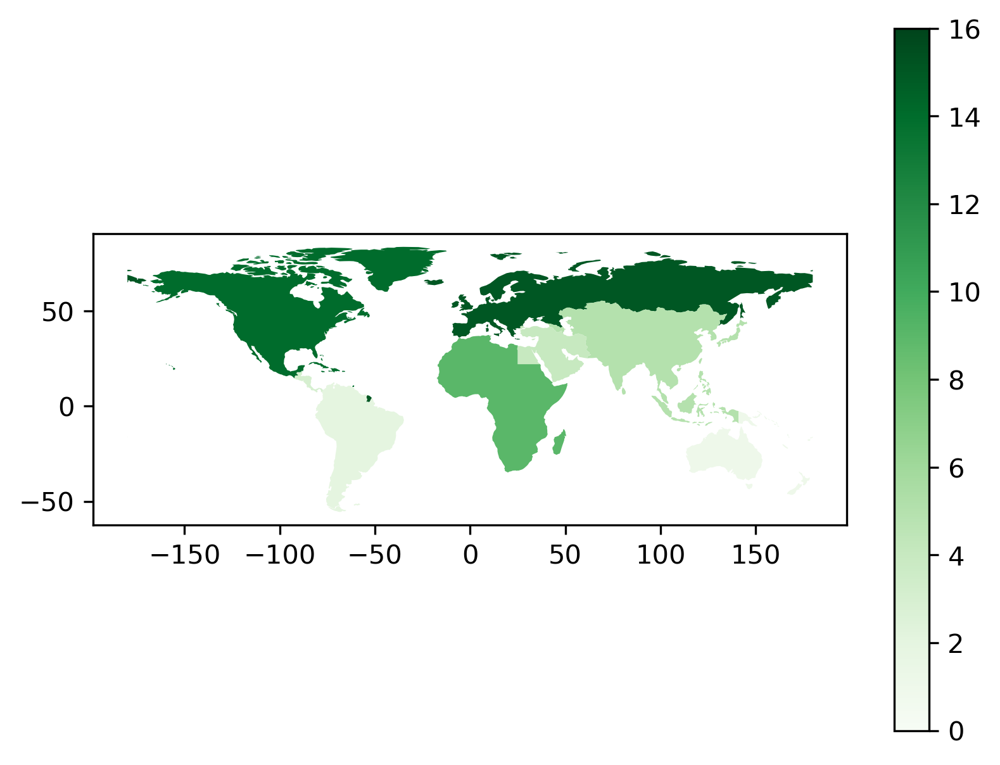

In [83]:
central_merged_regions.plot(
    column='Count', 
    legend=True,
    cmap='Greens',
    vmin=0,
    vmax=16
)

plt.savefig('../' + DATA_VERSION + '-fig/fig-councils/map_councils_central.png')
plt.show()

## Councils Analysis: Timeline 

In [84]:
council_dates_df = council_df[['Time span: Start', 'Time span: Duration', 'Name'] + council_cols]

In [85]:
council_dates_df

,Time span: Start,Time span: Duration,Name,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_council_central_
0,-200,200,Aedui (Celtic Oppida),0,1
1,1900,123,Akha,0,1
2,300,900,Amalfi,0,1
5,-508,186,Athens (Classical Period),0,1
6,1100,500,Aztec City-States,0,1
7,-900,300,Babylonia,0,1
8,-400,300,Carthage,0,1
9,900,600,Central African communities,1,0
11,-1200,500,Circassians,0,1
12,1200,200,Cologne,0,1


In [86]:
council_dates_tuples = [tuple(x) for x in council_dates_df.to_numpy()]
council_dates_tuples

[(-200, 200, 'Aedui (Celtic Oppida)', 0, 1),
 (1900, 123, 'Akha', 0, 1),
 (300, 900, 'Amalfi', 0, 1),
 (-508, 186, 'Athens (Classical Period)', 0, 1),
 (1100, 500, 'Aztec City-States', 0, 1),
 (-900, 300, 'Babylonia', 0, 1),
 (-400, 300, 'Carthage', 0, 1),
 (900, 600, 'Central African communities', 1, 0),
 (-1200, 500, 'Circassians', 0, 1),
 (1200, 200, 'Cologne', 0, 1),
 (1500, 300, 'Dutch Republic', 1, 0),
 (-2400, 100, 'Ebla ', 0, 1),
 (-2700, 1700, 'Egypt ', 1, 0),
 (1300, 300, 'Genoa (doge)', 0, 1),
 (1000, 300, 'Genoa (podesta)', 0, 1),
 (-480, 453, 'Greek democracies', 0, 1),
 (-480, 453, 'Greek oligarchies', 0, 1),
 (1100, 700, 'Haudenosanee (Iroquois)', 1, 1),
 (1450, 354, 'Hausa City-States', 0, 1),
 (900, 660, 'Igbo People', 0, 1),
 (1200, 600, 'Imperial and Free Towns of the Holy Roman Empire', 0, 1),
 (-1500, 1000, 'Indian Republics (Aristocratic Oligarchy)', 0, 1),
 (-1500, 1000, 'Indian Republics (C+A)', 0, 1),
 (1600, 200, 'Japan (Early Modern)', 1, 0),
 (1800, 100, 'Ka

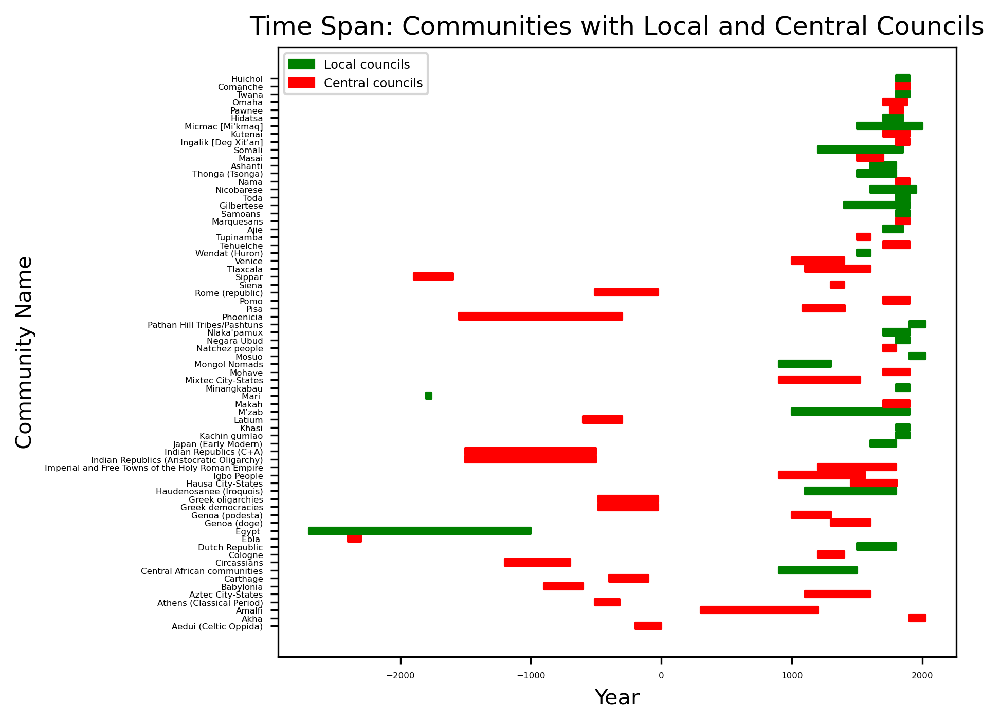

In [87]:
# create figure and plot
fig, ax = plt.subplots()
labels = []
for i, (
    start, 
    duration, 
    label, 
    is_local,
    is_central, 
) in enumerate(council_dates_tuples):
    if is_local:
        bar_color = 'green'
    elif is_central:
        bar_color = 'red'
    else:
        bar_color = 'grey' 
    
    labels.append(label)
    ax.broken_barh(
        [(start, duration)], 
        (i-0.4,0.8),
        color=bar_color
    )
    
# set yticks at the middle of the bars
ax.set_yticks(range(len(council_dates_tuples)))
ax.set_yticklabels(labels)
ax.tick_params(axis='both', which='major', labelsize=4)

ax.set_xlabel('Year')
ax.set_ylabel('Community Name')

plt.title('Time Span: Communities with Local and Central Councils')
# plt.figure(figsize=(80, 80))

# Create legend
red_patch = mpatches.Patch(color='green', label='Local councils')
yellow_patch = mpatches.Patch(color='red', label='Central councils')

ax.legend(
    handles=[
        red_patch,
        yellow_patch,
    ],
    loc='upper left',
    fontsize='xx-small'
)

plt.tight_layout()
plt.savefig('../' + DATA_VERSION + '-fig/fig-councils/timeline_councils.png')
plt.show()